* [1.Préparation des données](#pd)
* [2.Bag of word:CountVectorizer,Tf-idf](#bow)
* [3.Word embedding](#we)
 * [3.1.Word2Vec](#wv)
 * [3.2.Bert](#bert)
 * [3.3.USE](#use)


In [1]:
#!pip install tensorflow
#!pip install gensim
#!pip install transformers
#!pip install sentencepiece
#!pip install tensorflow_hub
#!pip install tensorflow_text
#!pip install spellchecker
#!pip install pyspellchecker
#!pip install textblob
#!pip  install pyLDAvis
#!pip install pycaret

# 1.Préparation des données <a class="anchor" id="pd"></a>

## Préparation du dataset et filtres de données

In [2]:
# Import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Fichier des tweets à récupérer sur : https://www.kaggle.com/crowdflower/twitter-airline-sentiment?select=Tweets.csv

path = 'Flipkart/' # à adapter = répertoire de stockage du dataset
data_T0 = pd.read_csv(path + "flipkart_com-ecommerce_sample_1050.csv")
print(data_T0.shape)

(1050, 15)


In [4]:
data_T0.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."


<AxesSubplot: >

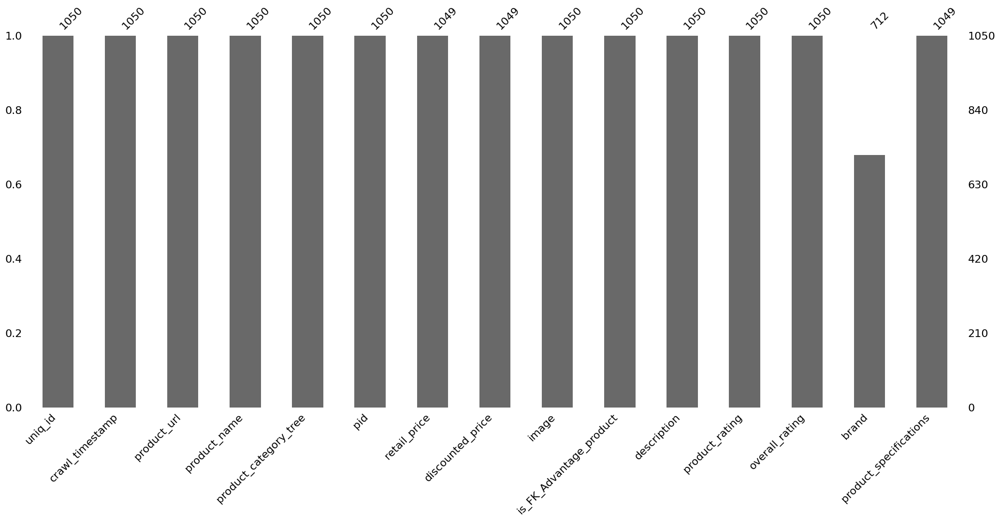

In [5]:
msno.bar(data_T0)

In [6]:
data_T0.isna().mean().mean()

0.02165079365079365

In [7]:
data_T0.duplicated().sum()

0

In [8]:
data_T0['product_category_tree']=data_T0['product_category_tree'].str.replace('[', '').str.replace('"', '')
#Splitting category column 
data_T0['main_category']=data_T0['product_category_tree'].str.split('>>', expand=True)[0]
data_T0['main_category'].value_counts()

Home Furnishing                150
Baby Care                      150
Watches                        150
Home Decor & Festive Needs     150
Kitchen & Dining               150
Beauty and Personal Care       150
Computers                      150
Name: main_category, dtype: int64

In [9]:
print("Number of main category ",data_T0['main_category'].nunique())

Number of main category  7


In [10]:
data_T0['main_category'].value_counts()

Home Furnishing                150
Baby Care                      150
Watches                        150
Home Decor & Festive Needs     150
Kitchen & Dining               150
Beauty and Personal Care       150
Computers                      150
Name: main_category, dtype: int64

In [232]:
def second_category(value):
    ''' extract the sub category of the product wich is after the first '>>'
        Parameters:
          value(string):the  product category
        retun (string):the string after the first '>>'
          
    '''
    try:
        return value.split('>>')[1]
    except IndexError:
        return 'None'
def third_category(value):
    ''' extract the sub sub category of the product wich is after the second '>>'
        Parameters:
          value(string):the  product category
        retun (string):the string after the second '>>'
        '''
    
    try:
        return value.split('>>')[2]
    except IndexError:
        return 'None'

In [12]:
data_T0['sub_category']=data_T0['product_category_tree'].apply(second_category)
data_T0['sub-sub_category']=data_T0['product_category_tree'].apply(third_category)
print("Number of sub category ",data_T0['sub_category'].nunique())
print("Number of sub sub category ",data_T0['sub-sub_category'].nunique())

Number of sub category  63
Number of sub sub category  247


In [13]:
cols=['description','product_name','image','main_category']
data1=data_T0[cols]


In [14]:
data1.head(2)

,description,product_name,image,main_category
0,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care


<AxesSubplot: >

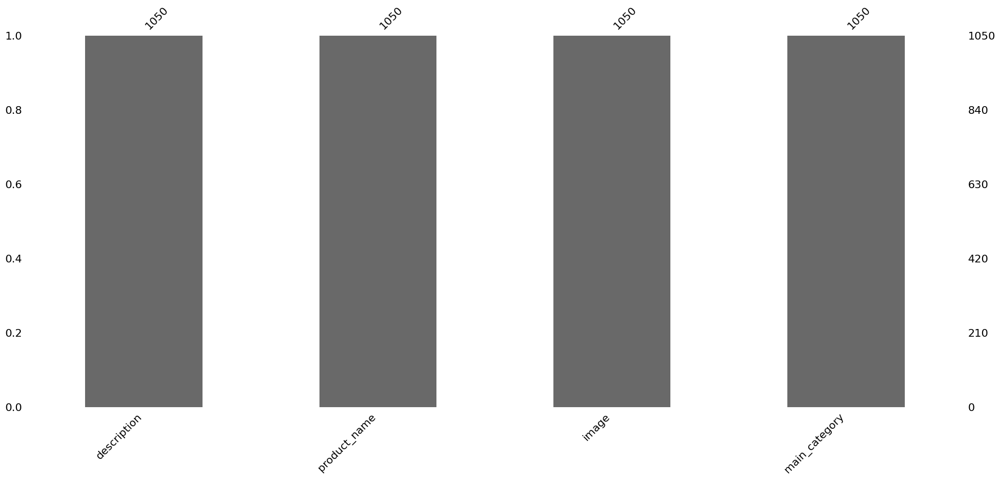

In [15]:
msno.bar(data1)

In [225]:
# Tokenizer
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.probability import FreqDist
from nltk.stem import PorterStemmer
from spellchecker import SpellChecker
from textblob import TextBlob

def tokenizer_fct(sentence) :
    '''tokenize a sentence after deletecting some caracters +,-,/,#
    Parameters:
        sentence (string):the document to be tokenized
    returns:
        word_tokens (string):tokenized document
    '''    
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
from nltk.corpus import stopwords
stop_w = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    '''filter  a sentence based on a given stop words list'''
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    '''lower words in  sentence if word not start with @ and http'''
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    '''lemmatization(word base)'''
    lemmatizer = WordNetLemmatizer()    
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

#stemming
def stem_fct(list_words) :
    """ stemming """
    porter = PorterStemmer()    
    stem_w = [porter.stem(w) for w in list_words]
    return stem_w
#spell checking
def spell_fct1(list_words):
    """spell checking on english text"""
    spell = SpellChecker()
    spell_w = [spell.correction(w) for w in list_words]
    return spell_w
def spell_fct(list_words):
    """spell checking on english text"""
    
    spell_w = [TextBlob(w) for w in list_words]
    return spell_w

def transform_bow_fct(desc_text) :
    '''preparing text for bag of words (Countvectorizer and Tf_idf, Word2Vec):tokenization+spell check+stop word filtering+lower case'''
    word_tokens = tokenizer_fct(desc_text)       
    sw = stop_word_filter_fct(word_tokens)    
    lw = lower_start_fct(sw)
    
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

# Preparing text for  bag of words with lemmatization
def transform_bow_lem_fct(desc_text) :
    '''preparing text for bag of words (Countvectorizer and Tf_idf, Word2Vec):
           tokenization+spell check+stop word filtering+
           lower case+lemmatization'''
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)    
    lw = lower_start_fct(sw)
    
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

# Preparing text bag of words with lemmatization+stemming
def transform_bow_lem_stem_fct(desc_text) :
    '''preparing text for bag of words (Countvectorizer et Tf_idf, Word2Vec):
           tokenization+spell check+stop word filtering+
           lower case+lemmatization+stemming'''
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)    
    lw = lower_start_fct(sw)

    lem_w = lemma_fct(lw) 
  
    stem_w = stem_fct(lem_w)
  
    transf_desc_text = ' '.join(stem_w)
    return transf_desc_text

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    '''preparing text for deep learning (USE and BERT):tokenization+spell check+lower case
       lower case+lemmatization'''
    word_tokens = tokenizer_fct(desc_text)
    #sw = stop_word_filter_fct(word_tokens) 
    lw = lower_start_fct(word_tokens)
    
    # lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

#word frequency
def most_frequent_words_fct(sentence):
    """list the 10 most frequent words"""
    sentence_tokens = word_tokenize(sentence)
    word_frequency = nltk.FreqDist(sentence_tokens)
    return(word_frequency.most_common(10))



In [17]:
data1.columns

Index(['description', 'product_name', 'image', 'main_category'], dtype='object')

In [18]:
#Description preparation for bag of words
data1['description_bow'] = data1['description'].apply(lambda x : transform_bow_fct(x))#tokonization+lower case+stop words
data1['description_bow_lem_stem'] = data1['description'].apply(lambda x : transform_bow_lem_stem_fct(x))#tokonization+lower case+stop words+lemmatization+stemming
#préparation du texte pour le Deep learning
data1['description_dl'] = data1['description'].apply(lambda x : transform_dl_fct(x))#tokonization+lower case


In [19]:


data1['most_frequent_10_w_description_bow_lem_stem']=\
   data1['description_bow_lem_stem'].apply(lambda x : most_frequent_words_fct(x))

In [20]:
data1['most_frequent_10_w_description_bow_lem_stem'].sample(5)

916    [(wallskart, 13), (warranti, 10), (product, 9)...
32     [(681gm_wht, 3), (d'signer, 2), (analog, 2), (...
648    [(drawer, 3), (not, 3), (babi, 2), (boy, 2), (...
117    [(babi, 4), (anthil, 2), (boy, 2), (girl, 2), ...
795    [(watch, 4), (prsmd, 3), (rana, 2), (barbi, 2)...
Name: most_frequent_10_w_description_bow_lem_stem, dtype: object

In [21]:
#product name  preparation for bag of words
data1['pdtname_bow'] = data1['product_name'].apply(lambda x : transform_bow_fct(x))#tokonization+lower case+stop words
data1['pdtname_bow_lem_stem'] = data1['product_name'].apply(lambda x : transform_bow_lem_stem_fct(x))#tokonization+lower case+stop words+lemmatization+stemming
#préparation du texte pour le Deep learning
data1['pdtname_dl'] = data1['product_name'].apply(lambda x : transform_dl_fct(x))#tokonization+lower case


In [22]:
data1.columns

Index(['description', 'product_name', 'image', 'main_category',
       'description_bow', 'description_bow_lem_stem', 'description_dl',
       'most_frequent_10_w_description_bow_lem_stem', 'pdtname_bow',
       'pdtname_bow_lem_stem', 'pdtname_dl'],
      dtype='object')

In [23]:
data1.to_csv("data_product.csv",index=False)

# Préparation commune des traitements

In [24]:
# Import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import pickle
import time
from sklearn import cluster, metrics
from sklearn import manifold, decomposition
import logging

logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging everywhere


## Lecture dataset

In [25]:
data_T = pd.read_csv("data_product.csv")
print(data_T.shape)

(1050, 11)


In [26]:
l_cat = list(set(data_T['main_category']))
print("catégories : ", l_cat)


catégories :  ['Computers ', 'Baby Care ', 'Beauty and Personal Care ', 'Home Decor & Festive Needs ', 'Watches ', 'Kitchen & Dining ', 'Home Furnishing ']


In [27]:
#convert main_category (target) to int
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_cat_num = le.fit_transform(data_T['main_category'])
set(y_cat_num)

{0, 1, 2, 3, 4, 5, 6}

In [28]:
data_T.columns

Index(['description', 'product_name', 'image', 'main_category',
       'description_bow', 'description_bow_lem_stem', 'description_dl',
       'most_frequent_10_w_description_bow_lem_stem', 'pdtname_bow',
       'pdtname_bow_lem_stem', 'pdtname_dl'],
      dtype='object')

In [29]:
from nltk.tokenize import sent_tokenize, word_tokenize
data_T['length_bow'] = data_T['description_bow'].apply(lambda x : len(word_tokenize(x)))
print("max length bow : ", data_T['length_bow'].max())
data_T['length_bow_lem_stem'] = data_T['description_bow_lem_stem'].apply(lambda x : len(word_tokenize(x)))
print("max length bow_lem_stem : ", data_T['length_bow_lem_stem'].max())
data_T['length_dl'] = data_T['description_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", data_T['length_dl'].max())
#print("most frequent 10 words in description bow (bag of words) ",frequent_words(data_T['description_bow']))
#(print('*'*10))
#print("most frequent 10 words in description bow_lem (bag of words+lemmatization+stemming) ",frequent_words(data_T['description_bow_lem_stem']))
#(print('*'*10))
#print("most frequent 10 words in description dl (deep leaning) ",frequent_words(data_T['description_dl']))


max length bow :  379
max length bow_lem_stem :  379
max length dl :  632


In [30]:
num_labels=len(l_cat)

## Fonctions communes

In [258]:
import time
# calcul pca
from sklearn import manifold, decomposition


def reduce_pca(features, technique):
    '''reduce feature dimensionality using PCA
       parameters:
           features_init (int matrix):features to be reduced
           tehnique (string):the method used to extract features_init
       return:
           feat_pca(int matrix):reduced features  
    '''
    print(
        f"Dimensions feature {technique} avant réduction PCA : {features.shape}")
    pca = decomposition.PCA(n_components=0.95)
    # feat_pca= pca.fit_transform(cv_transform)#PCA does not support sparse input. See TruncatedSVD for a possible alternative.
    feat_pca = pca.fit_transform(features.toarray())
    # tsvd=decomposition.TruncatedSVD(n_components=2)
    #feat_tsvd= tsvd.fit_transform(cv_transform)
    #print("Dimensions TF_IDF après réduction TruncatedSVD : ", feat_tsvd.shape)

    print(f"Dimensions feature {technique} réduction PCA : {feat_pca.shape}")
    return feat_pca
# Calcul Tsne


def reduce_tsne(features, technique, per):
    '''reduce feature dimensionality using tsne (2 components)
       parameters:
           features_init (int matrix):features to be reduced
           tehnique (string):the method used to extract features_init
       return:
           feat_tsne(int matrix):reduced features  
    '''
    print(
        f"Dimensions feature {technique} avant réduction TSNE : {features.shape}")
    tsne = manifold.TSNE(n_components=2, perplexity=per, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    feat_tsne = tsne.fit_transform(features)

    print(f"Dimensions feature {technique} réduction TSNE : {feat_tsne.shape}")
    return feat_tsne

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters


def ARI_fct(features, per):
    '''
    -Calcul Tsne+
    -détermination des clusters +
    -calcul ARI entre vrais catégorie et n° de clusters
    Parameters:
      features(numeric matrix): data to be reduced 
      per (int):perplexity parameter for the tsne
    returns:
      ARI (float): the ARI score between the real label and the label predicted by the kmeans (k=number of real labels)
      X_tsne (numeric matrix):reduced data
      cls.labels_ (int list): predicted label by the kmeans
    '''
    time1 = time.time()

    X_tsne = reduce_tsne(features, '', per)
    # tsne = manifold.TSNE(n_components=2, perplexity=per, n_iter=2000,
    # init='random', learning_rate=200, random_state=42)
    #X_tsne = tsne.fit_transform(features)

    # Détermination des clusters à partir des données après Tsne
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_), 4)
    time2 = np.round(time.time() - time1, 0)
    print("ARI : ", ARI, "time : ", time2, "perplexity : ", per)

    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI, figsiz):
    '''visualisation du Tsne selon les vraies catégories et selon les clusters 
    Parameters:
       X_tsne(int matrix):reduced data after TSNE
       y_cat_num (int list)
       labels (int list):labels which are predicted by kmeans
       figsiz tuple of int): figure size(dim1,dim2)
    returns:
       figure
    '''
    #fig = plt.figure(figsize=(15,6))
    fig = plt.figure(figsize=figsiz)

    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[
              0], labels=l_cat, loc="best", title="Catégorie principale")
    plt.title('Représentation des produits \n par catégories principales réelles   ')

    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(
        labels), loc="best", title="Clusters")
    plt.title('Représentation des produits \n par clusters')

    plt.show()
    print("ARI : ", ARI)

 # choisir le nombre de composants pour TruncatedSVD


def select_n_components(features, goal_var):
    '''Réduire les dimensions en utilisant la méthode TruncatedSVD en respectant une variance cible.
    Parameters:
       features (int matrix):matrice de features
       goal_var(float): variance seuil
    returns:
       comp(int):nombre de dimensions optimale 

    '''
    comp = 1
    tsvd = decomposition.TruncatedSVD(n_components=comp)
    feat_tsvd = tsvd.fit_transform(cv_transform)
    variance = tsvd.explained_variance_ratio_.sum()
    while (variance < goal_var):
        comp += 1
        tsvd = decomposition.TruncatedSVD(n_components=comp)
        feat_tsvd = tsvd.fit_transform(cv_transform)
        total_variance = tsvd.explained_variance_ratio_.sum()

        #print(f"Total Explained variation by the {comp} components is {variance}")
        if (total_variance >= goal_var):
            # End the loop
            print(
                f"Total Explained variation by the {comp} components is {total_variance}")
            break

    # Return the number of components
    return comp
def tsne_param(features, per):
    '''Visualision des figures pour chaque valeur de perplexity 
       Parameters:
         features (int matrix):data to reduce
         per (int list):list of perplexity values
       Returns:
         figures
    '''
    for p in per:
        try:
            ARI, X_tsne, labels = ARI_fct(features, p)
        except:
            print('erreur1')
        try:
            TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI, (10, 5))
        except:
            print('erreur2')
            

def feature_cluster(X_tsne,labels):
    '''calculer nombre de features par cluster,affiche le resulta et son histogramme
    Prameters:
      Xtsne (int matrix with 2 columns):the reduced Xtsne features
      labels(int list):lists of cluster
    returns:
      feat_cluster(dataframe):dataframe with the cluster and the number of associeted feature
    '''
    dftsne_cl=pd.DataFrame({'tsne': X_tsne[:,0],'tsne1':X_tsne[:,1], 'cluster':labels})
    feat_cluster=pd.DataFrame(dftsne_cl.groupby('cluster')['cluster'].count()).rename(columns={'cluster':'nb_feature'}).reset_index()
  
    display(feat_cluster)
    sns.barplot(x=feat_cluster.cluster, y=feat_cluster.nb_feature)
    return feat_cluster


def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    # corresp = np.argmax(conf_mat, axis=0)
    corresp = [3, 1, 2, 0]
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']


def perf_clustering(y_true,y_predicted):
    
    conf_mat = metrics.confusion_matrix(y_true,y_predicted)
    #print(conf_mat)
    try:
        df_cmd =pd.DataFrame(conf_mat, index = [label for label in l_cat],
                  columns = [i for i in "0123456"])          
    except:
          print('err0',conf_mat)
    plt.figure(figsize = (6,4))
    sns.heatmap(df_cmd, annot=True, cmap="Blues")
    print()
    print(metrics.classification_report(y_true,y_predicted))

# 2.Bag of word :CountVectorize, Tf-idf <a class="anchor" id="bow"></a>
**a.Bag of words**(Le One-Hot) consite à créer un dictionnaire avec tous les mots qui apparaissent dans nos phrases nettoyées.

-Ce dictionnaire est en fait un tableau où chaque colonne représente un mot et chaque ligne représente une phrase.

-Si tel mot apparaît dans tel phrase, on met une valeur de 1 dans l’élément du tableau, sinon on met une valeur de 0.

-On aura donc un tableau composé uniquement de 0 et de 1.
<br>
**b.TF_IDF** consiste àcompter le nombre d’occurrences des tokens présents dans le corpus pour chaque texte, que l’on divise ensuite par le nombre d’occurrences total de ces même tokens dans tout le corpus.

## Préparation sentences

In [33]:
# création du bag of words (CountVectorizer et Tf-idf)
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
feat1 = 'description_bow_lem_stem'
feat2='pdtname_bow_lem_stem'
#Convert a collection of text documents to a matrix of token counts.
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)#max_df:maximum document frequency.
#Convert a collection of raw documents to a matrix of TF-IDF features
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)


cv_fit = cvect.fit(data_T[feat1])#Learn a vocabulary dictionary of all tokens in data_T[feat2]

ctf_fit = ctf.fit(data_T[feat1])
# Encode the Document
cv_transform1 = cvect.transform(data_T[feat1]) #Extract token counts out of data_T[feat1,feat2] using the vocabulary fitted with fit
cv_transform2 = cvect.transform(data_T[feat2]) 
cv_transform=cvect.transform(data_T[feat1]+data_T[feat2]) 

ctf_transform1 = ctf.transform(data_T[[feat1]])  
ctf_transform2 = ctf.transform(data_T[feat2]) 
ctf_transform = ctf.transform(data_T[feat1]+data_T[feat2]) 

In [70]:
def explore_feat(features,vect,technique):
    ''' espoloration rapide des features
        Parameters:
           features (intb matrix): features matrix
           vect:
           technique (string): la technique de bow utiliser pour extraire les features
        returns:
    
    '''
    print(technique)
    print('------')
    print("First 10 features", list(vect.get_feature_names())[0:8])
    print("First 10 Vocabulary : ", list(vect.vocabulary_.items())[0:8])
    df_feat = pd.DataFrame(features.toarray(), columns = vect.get_feature_names())
    display(df_feat.head())

In [71]:
explore_feat(cv_transform,cvect,'CountVectorizer')

CountVectorizer
------
First 10 features ['000', '001', '0021', '004', '005', '006', '0083', '011']
First 10 Vocabulary :  [('key', 2663), ('featur', 2046), ('eleg', 1879), ('polyest', 3486), ('multicolor', 3086), ('abstract', 750), ('eyelet', 1997), ('door', 1773)]


,000,001,0021,004,005,006,0083,011,01433cmgi,01727lpln,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [72]:
explore_feat(ctf_transform,ctf,'TF_IDF')

TF_IDF
------
First 10 features ['000', '001', '0021', '004', '005', '006', '0083', '011']
First 10 Vocabulary :  [('key', 2663), ('featur', 2046), ('eleg', 1879), ('polyest', 3486), ('multicolor', 3086), ('abstract', 750), ('eyelet', 1997), ('door', 1773)]


,000,001,0021,004,005,006,0083,011,01433cmgi,01727lpln,...,zikrak,zinc,zingalalaa,zip,zipexterior,zipper,zone,zoom,zora,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
cv_transform


<1050x4826 sparse matrix of type '<class 'numpy.int64'>'
	with 33867 stored elements in Compressed Sparse Row format>

In [41]:
ctf_transform

<1050x4826 sparse matrix of type '<class 'numpy.float64'>'
	with 33867 stored elements in Compressed Sparse Row format>

## Classification

### Reduction des dimensions des features

In [45]:
#PCA  
    
cv_transform_pca=reduce_pca(cv_transform,'CountVectorizer')
ctf_transform_pca=reduce_pca(ctf_transform,'TF_IDF')

Dimensions feature CountVectorizer avant réduction PCA : (1050, 4826)
Dimensions feature CountVectorizer réduction PCA : (1050, 419)
Dimensions feature TF_IDF avant réduction PCA : (1050, 4826)
Dimensions feature TF_IDF réduction PCA : (1050, 729)


**PCA vs Truncated**
- PCA: a réduit les dimensions jusqu'a 90% des dimensions initiales(cv) ,(85% tf_idf)(en transformant la matrice creuse en un tableau)
- TruncatedSVD :on va tester TruncatedSVD qui est dédié pour travailler avec les matrices creuses.

In [46]:
opt_cmp=select_n_components(cv_transform,0.95)
tsvd=decomposition.TruncatedSVD(n_components=opt_cmp)
feat_tsvd= tsvd.fit_transform(cv_transform)
print('CountVectorizer')
print('-------')
#print("Explained variation per principal component: \n {}".format(tsvd.explained_variance_ratio_))
print("Total Explained variation by the first {} components: \n{}".format(opt_cmp,tsvd.explained_variance_ratio_.sum()))

Total Explained variation by the 421 components is 0.950036993653542
CountVectorizer
-------
Total Explained variation by the first 421 components: 
0.9500079291667963


#### Choix du paramètre perplexity tsne pour chacun des modèles
- la "perplexité" indique (en gros) comment équilibrer l'attention entre les aspects locaux et globaux de vos données. 
- Ce paramètre est, en quelque sorte, une estimation du nombre de voisins proches de chaque point.

TSNE (CountVectorizer ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2696 time :  5.0 perplexity :  5


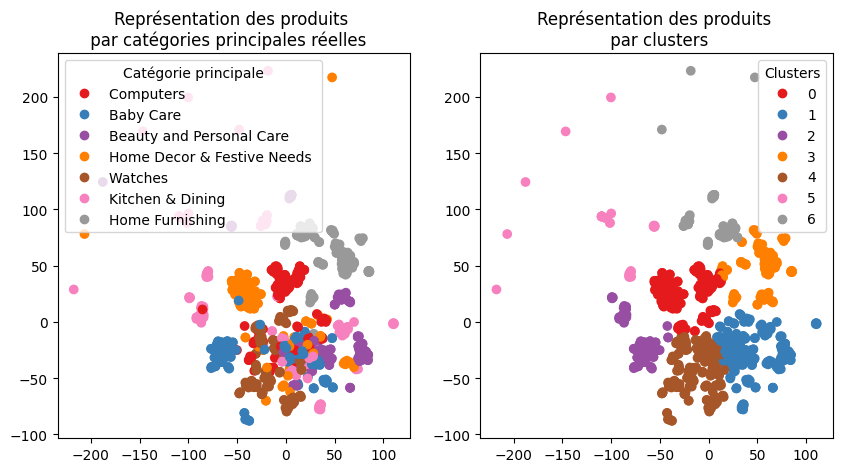

ARI :  0.2696
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3898 time :  5.0 perplexity :  10


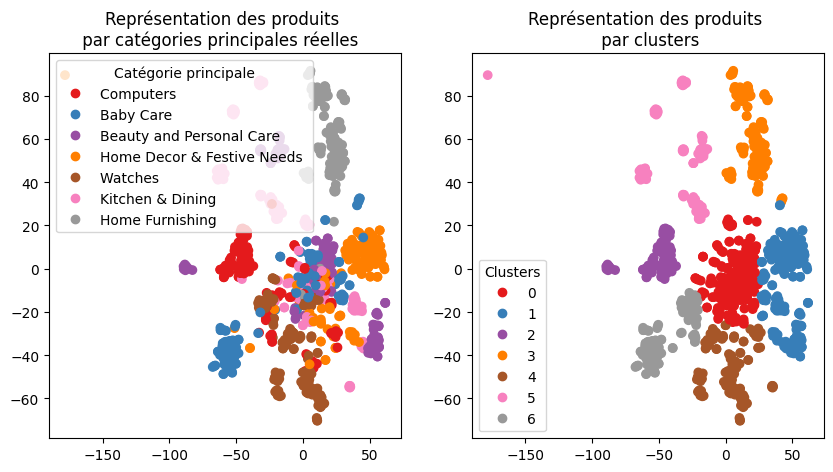

ARI :  0.3898
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4347 time :  6.0 perplexity :  20


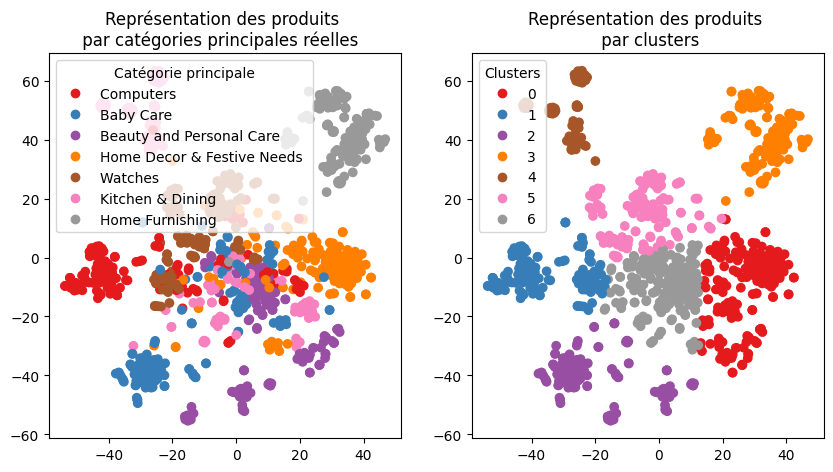

ARI :  0.4347
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4488 time :  7.0 perplexity :  30


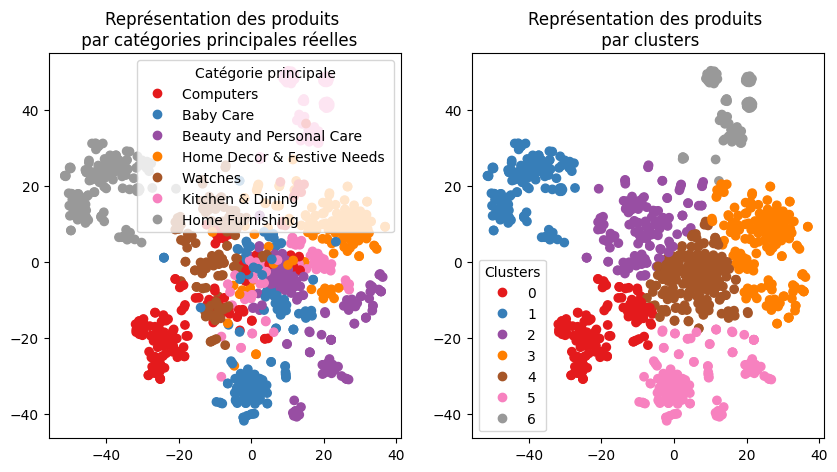

ARI :  0.4488
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4374 time :  9.0 perplexity :  50


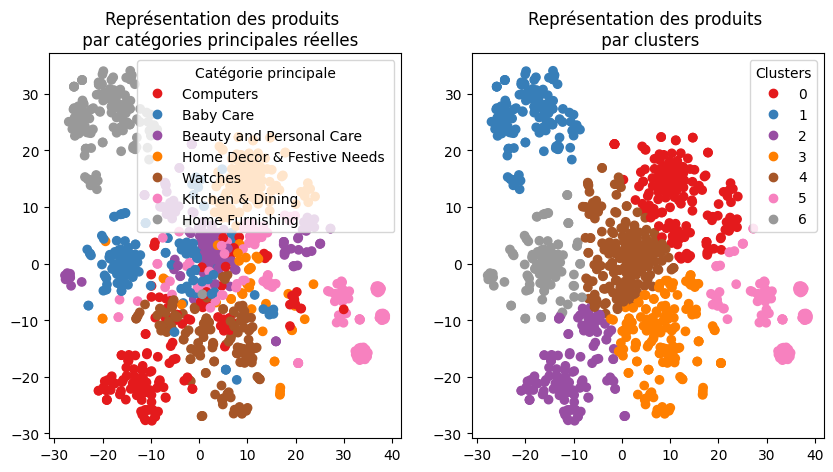

ARI :  0.4374


In [50]:
per=[5,10,20,30,50]
print("TSNE (CountVectorizer ): ")
print("--------")
tsne_param(cv_transform,per)

TSNE (CountVectorizer ) after pca dimensionality reduction: 
--------
Dimensions feature  avant réduction TSNE : (1050, 419)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2735 time :  5.0 perplexity :  5


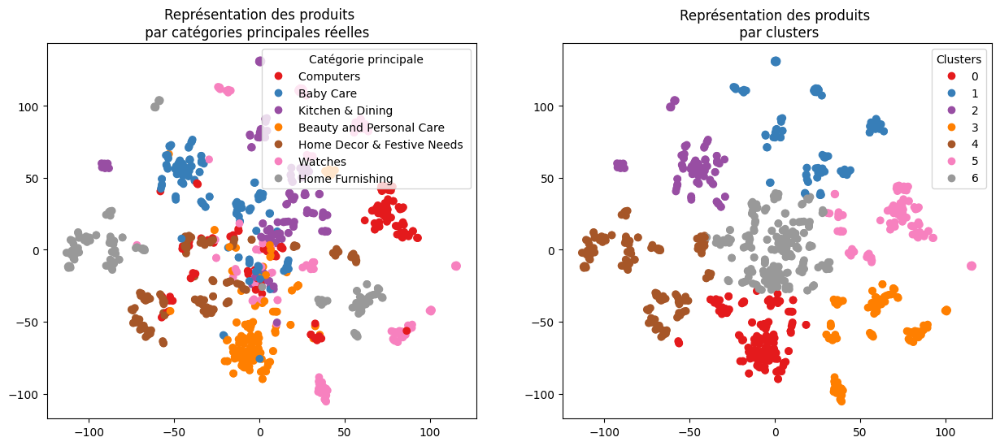

Dimensions feature  avant réduction TSNE : (1050, 419)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4376 time :  5.0 perplexity :  10


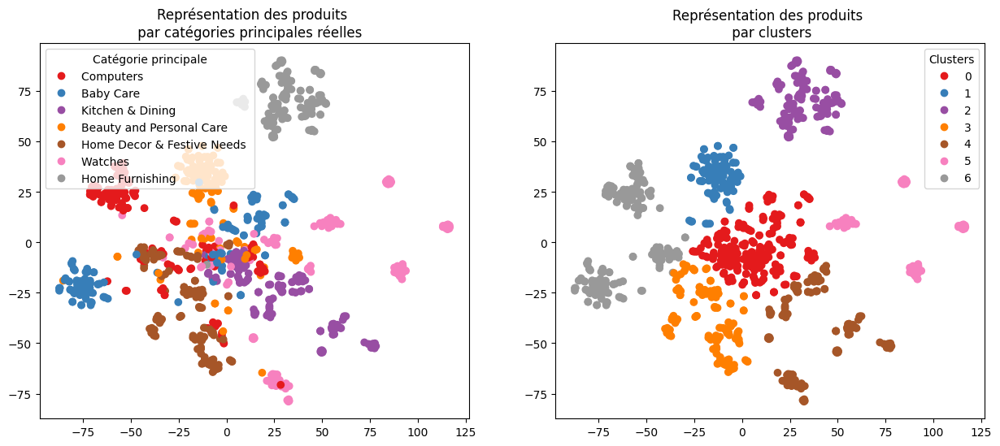

Dimensions feature  avant réduction TSNE : (1050, 419)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.5223 time :  7.0 perplexity :  20


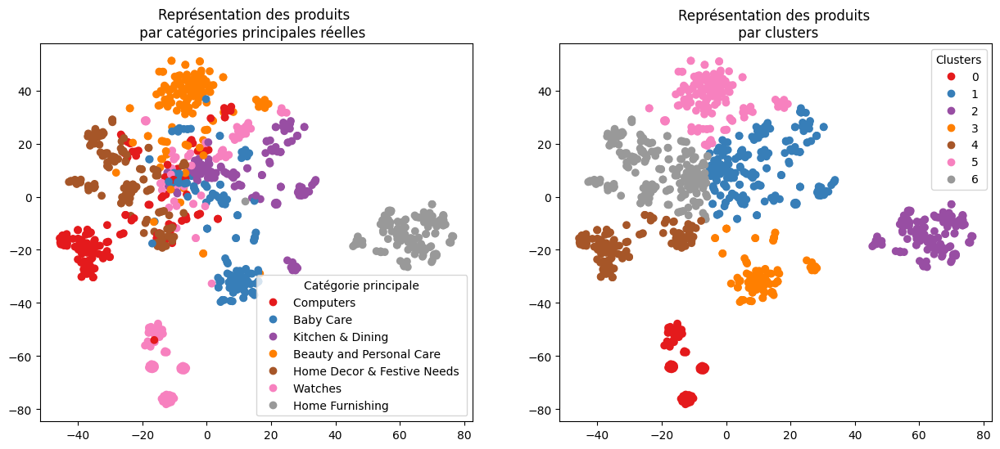

Dimensions feature  avant réduction TSNE : (1050, 419)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.5009 time :  8.0 perplexity :  30


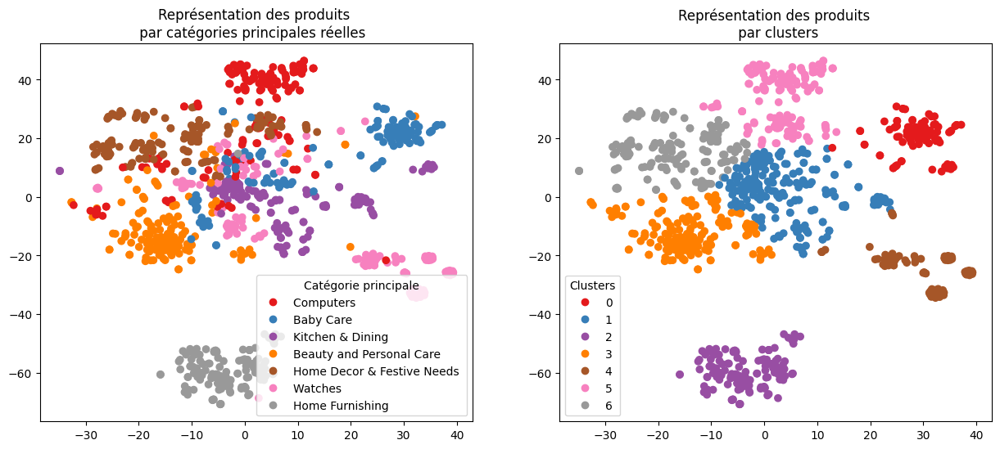

Dimensions feature  avant réduction TSNE : (1050, 419)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4107 time :  9.0 perplexity :  50


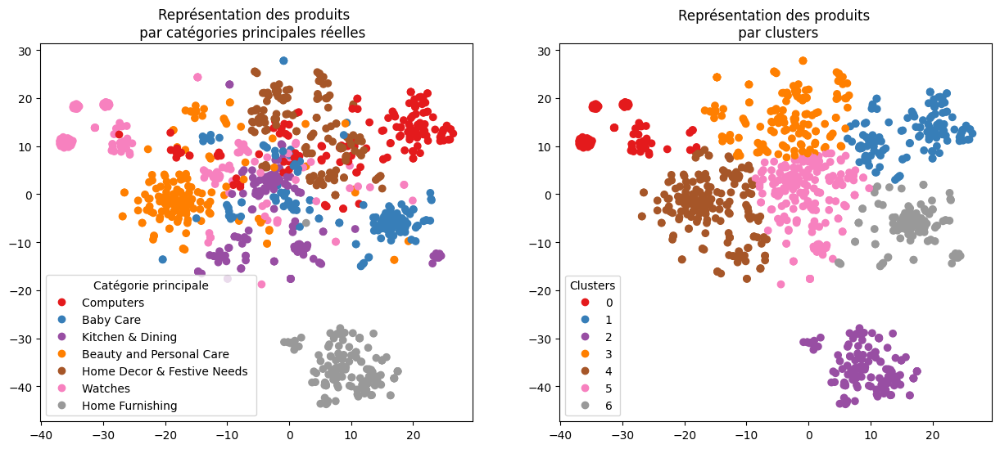

In [261]:
per=[5,10,20,30,50]
print("TSNE (CountVectorizer ) after pca dimensionality reduction: ")
print("--------")
tsne_param(cv_transform_pca,per)

TSNE (Tf-idf ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4511 time :  5.0 perplexity :  5


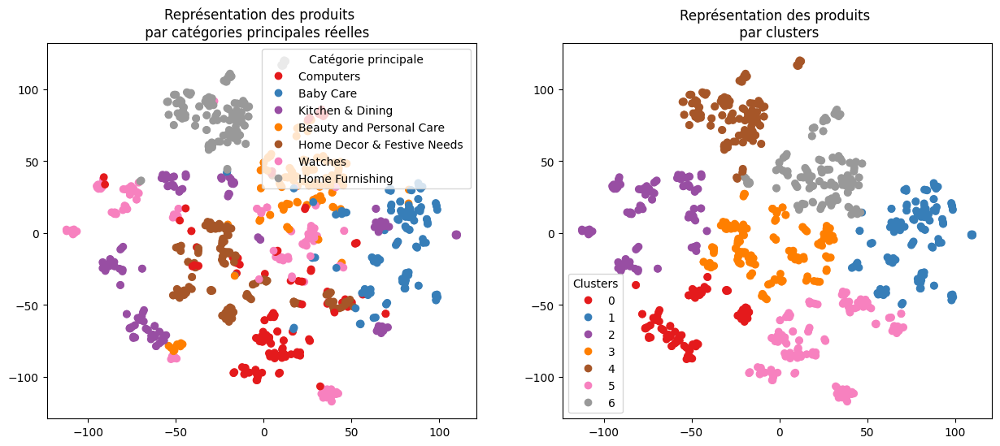

Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4817 time :  5.0 perplexity :  10


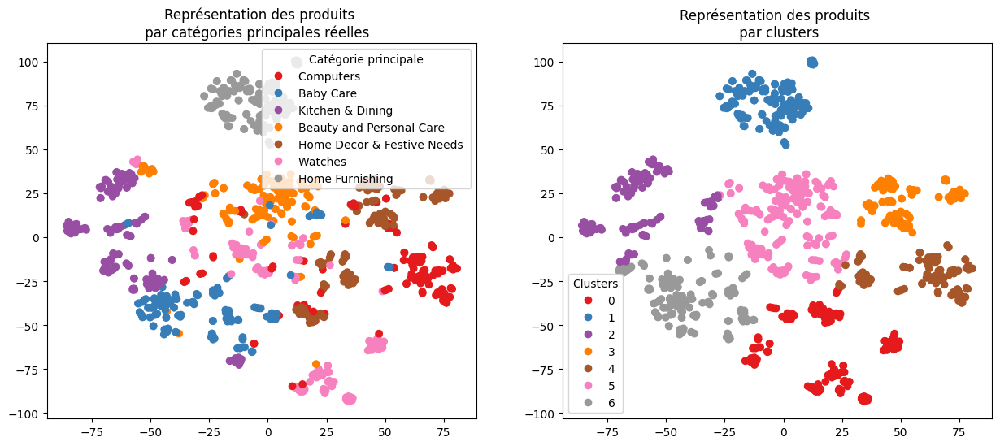

Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4743 time :  6.0 perplexity :  20


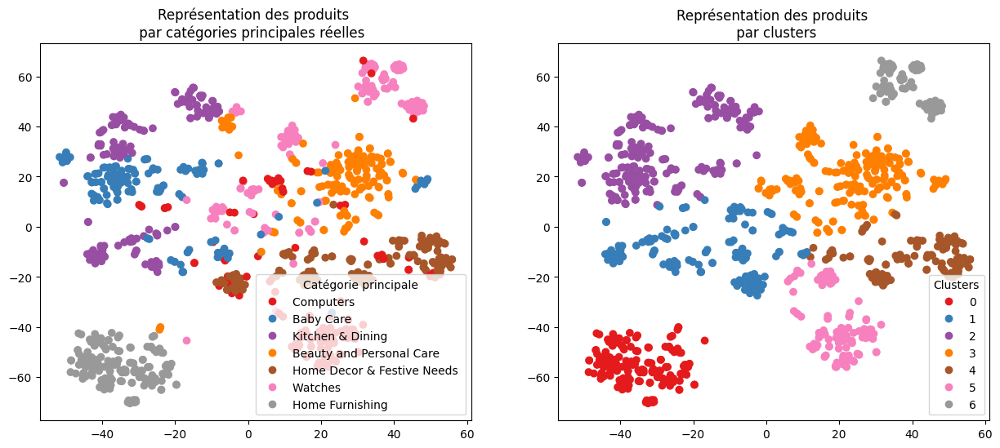

Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.5205 time :  7.0 perplexity :  30


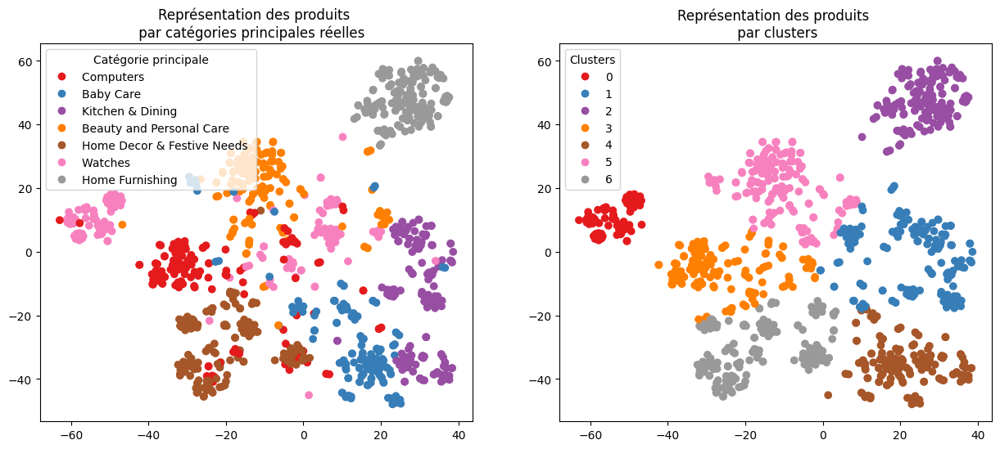

Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4823 time :  8.0 perplexity :  50


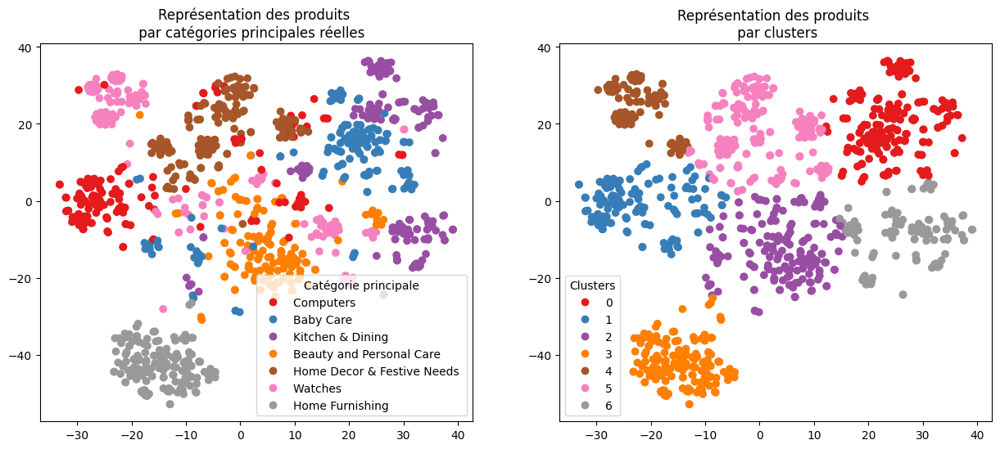

In [262]:
per=[5,10,20,30,50]
print("TSNE (Tf-idf ): ")
print("--------")
tsne_param(ctf_transform,per)

TSNE (Tf-idf ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 729)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3645 time :  5.0 perplexity :  5


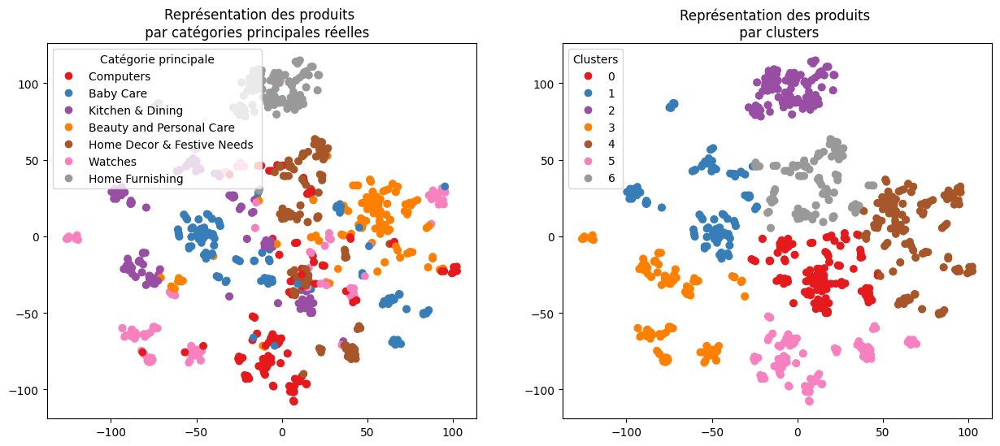

Dimensions feature  avant réduction TSNE : (1050, 729)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.5008 time :  6.0 perplexity :  10


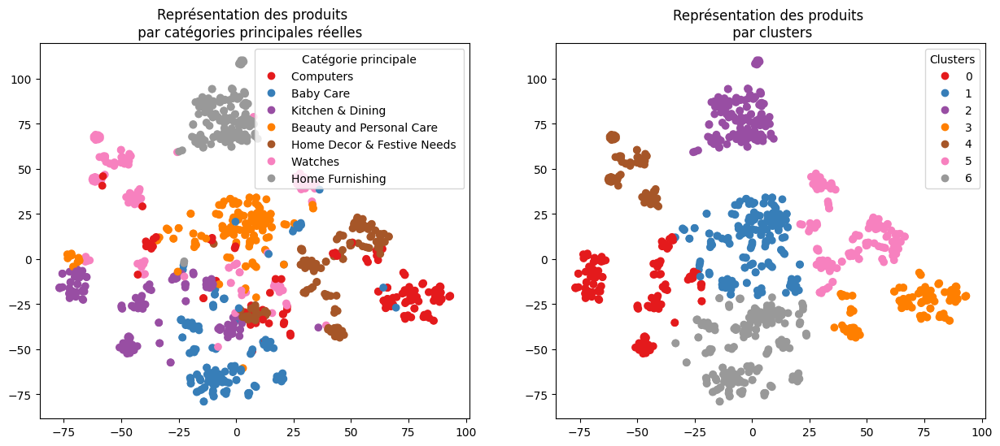

Dimensions feature  avant réduction TSNE : (1050, 729)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4948 time :  7.0 perplexity :  20


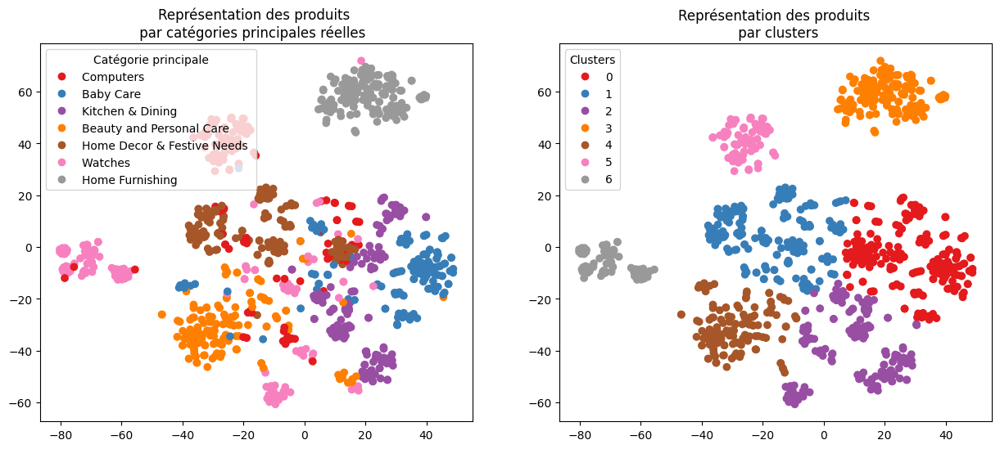

Dimensions feature  avant réduction TSNE : (1050, 729)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4901 time :  7.0 perplexity :  30


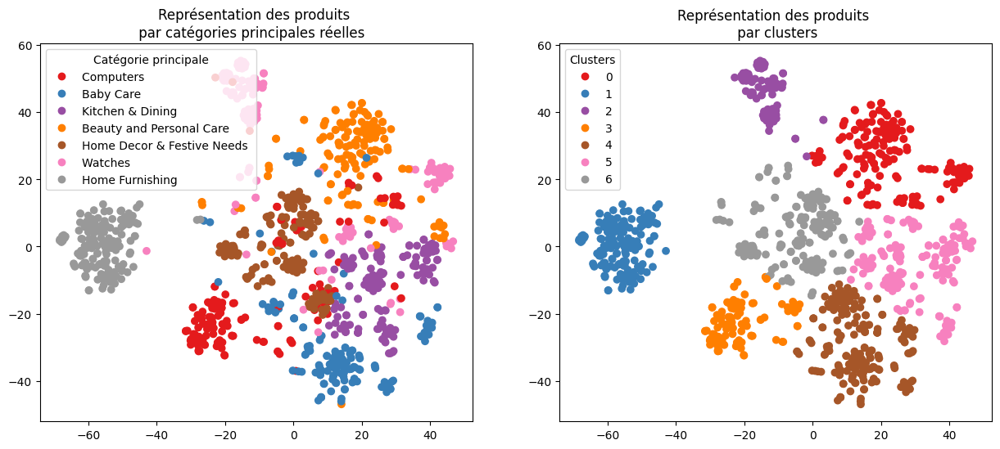

Dimensions feature  avant réduction TSNE : (1050, 729)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4682 time :  9.0 perplexity :  50


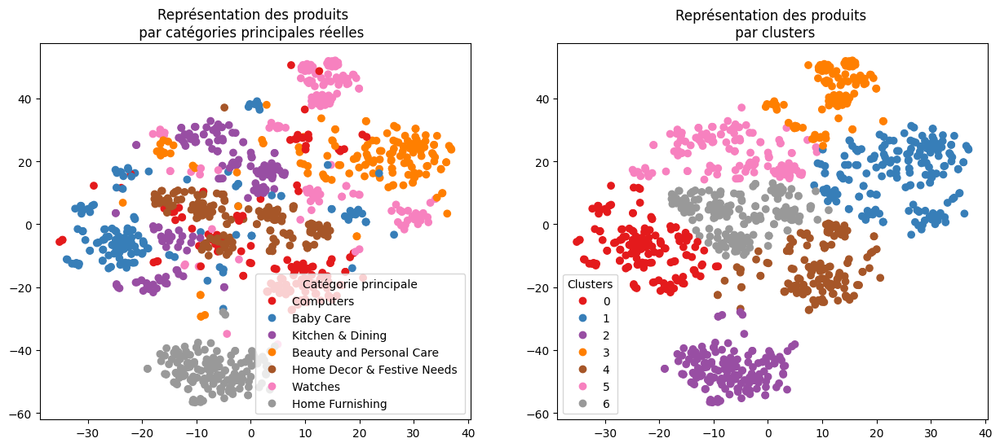

In [263]:
per=[5,10,20,30,50]
print("TSNE (Tf-idf ): ")
print("--------")
tsne_param(ctf_transform_pca,per)

## Classification non supervisée (KMeans)sur les features obtenues

CountVectorizer : 
-----------------
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4488 time :  7.0 perplexity :  30


,cluster,nb_feature
0,0,140
1,1,149
2,2,156
3,3,186
4,4,191
5,5,146
6,6,82


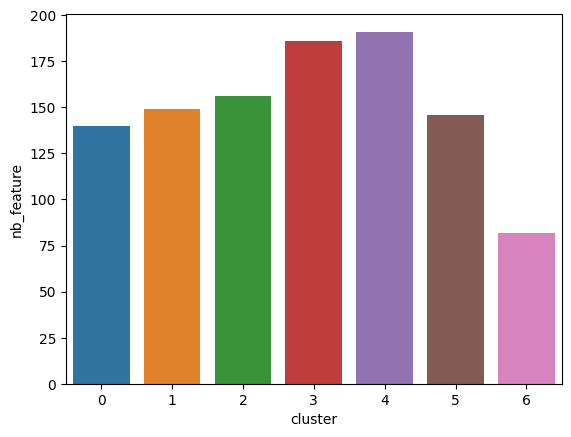

In [228]:
print("CountVectorizer : ")
print("-----------------")
ARI1, X_tsne1, labels1 = ARI_fct(cv_transform,30)
df1=feature_cluster(X_tsne1,labels1)
print()



              precision    recall  f1-score   support

           0       0.74      0.69      0.72       150
           1       0.00      0.00      0.00       150
           2       0.02      0.02      0.02       150
           3       0.60      0.74      0.66       150
           4       0.04      0.05      0.04       150
           5       0.04      0.04      0.04       150
           6       0.00      0.00      0.00       150

    accuracy                           0.22      1050
   macro avg       0.21      0.22      0.21      1050
weighted avg       0.21      0.22      0.21      1050



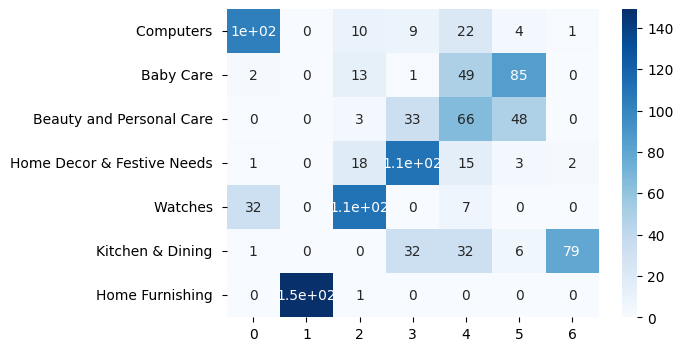

In [259]:
perf_clustering(y_cat_num,labels1)

Tf-idf : 
--------
Dimensions feature  avant réduction TSNE : (1050, 4826)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4817 time :  5.0 perplexity :  10


,cluster,nb_feature
0,0,151
1,1,152
2,2,141
3,3,105
4,4,121
5,5,214
6,6,166


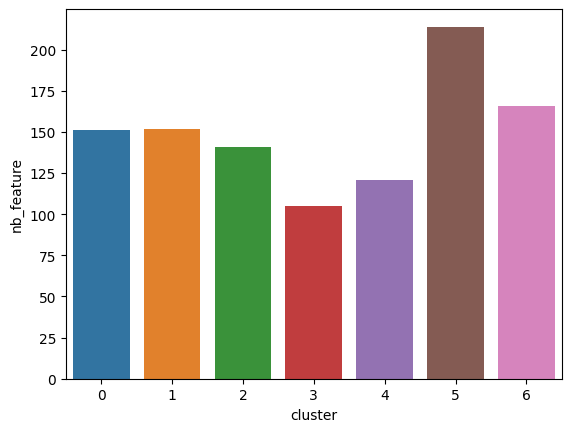

In [229]:
print("Tf-idf : ")
print("--------")
ARI2, X_tsne2, labels2 = ARI_fct(ctf_transform,10)
df2=feature_cluster(X_tsne2,labels2)


              precision    recall  f1-score   support

           0       0.13      0.13      0.13       150
           1       0.00      0.00      0.00       150
           2       0.67      0.63      0.65       150
           3       0.01      0.01      0.01       150
           4       0.24      0.19      0.21       150
           5       0.24      0.34      0.28       150
           6       0.00      0.00      0.00       150

    accuracy                           0.19      1050
   macro avg       0.18      0.19      0.18      1050
weighted avg       0.18      0.19      0.18      1050



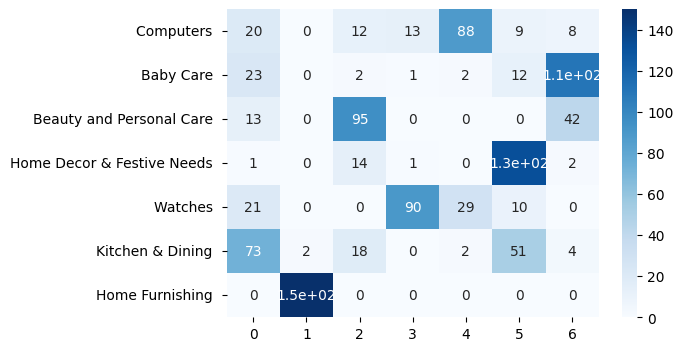

In [260]:
perf_clustering(y_cat_num,labels2)

CountVectorizer (PCA): 
-----------------
Dimensions feature  avant réduction TSNE : (1050, 419)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.5009 time :  7.0 perplexity :  30


,cluster,nb_feature
0,0,100
1,1,229
2,2,150
3,3,174
4,4,84
5,5,147
6,6,166


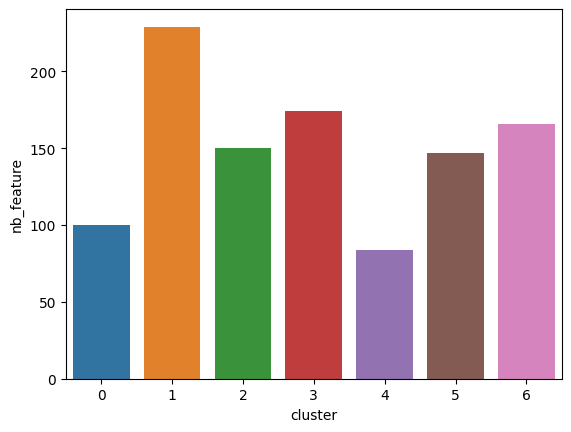

In [233]:
print("CountVectorizer (PCA): ")
print("-----------------")
ARI3, X_tsne3, labels3 = ARI_fct(cv_transform_pca,30)
df3=feature_cluster(X_tsne3,labels3)
print()




              precision    recall  f1-score   support

           0       0.00      0.00      0.00       150
           1       0.17      0.27      0.21       150
           2       0.00      0.00      0.00       150
           3       0.70      0.81      0.75       150
           4       0.00      0.00      0.00       150
           5       0.01      0.01      0.01       150
           6       0.00      0.00      0.00       150

    accuracy                           0.16      1050
   macro avg       0.13      0.16      0.14      1050
weighted avg       0.13      0.16      0.14      1050



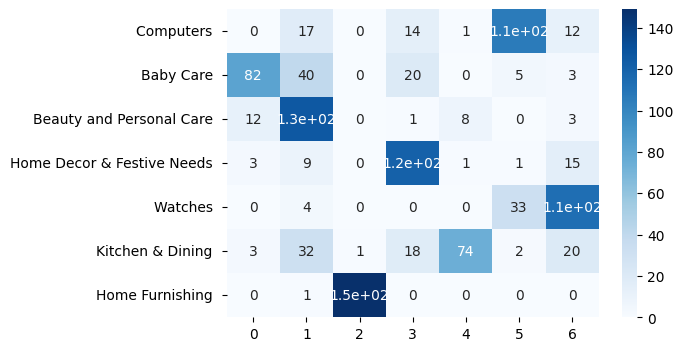

In [261]:
perf_clustering(y_cat_num,labels3)


Tf-idf (PCA): 
--------
Dimensions feature  avant réduction TSNE : (1050, 729)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4948 time :  6.0 perplexity :  20


,cluster,nb_feature
0,0,220
1,1,200
2,2,177
3,3,151
4,4,139
5,5,86
6,6,77


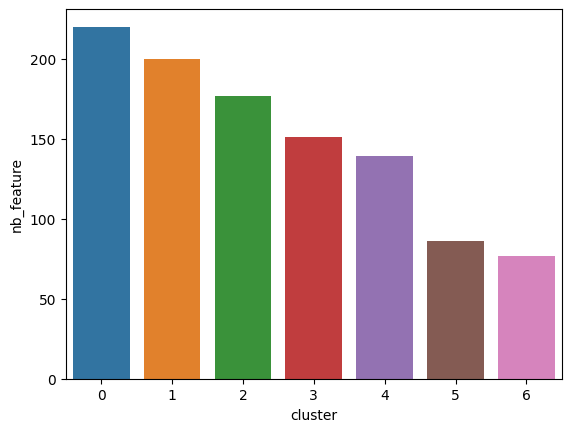

In [234]:
print()
print("Tf-idf (PCA): ")
print("--------")
ARI4, X_tsne4, labels4 = ARI_fct(ctf_transform_pca,20)
df4=feature_cluster(X_tsne4,labels4)
print()


              precision    recall  f1-score   support

           0       0.12      0.17      0.14       150
           1       0.07      0.09      0.08       150
           2       0.54      0.63      0.58       150
           3       0.00      0.00      0.00       150
           4       0.01      0.01      0.01       150
           5       0.00      0.00      0.00       150
           6       0.00      0.00      0.00       150

    accuracy                           0.13      1050
   macro avg       0.10      0.13      0.12      1050
weighted avg       0.10      0.13      0.12      1050



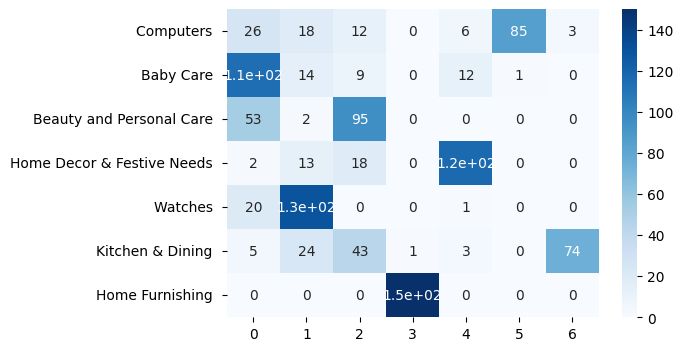

In [262]:
perf_clustering(y_cat_num,labels4)

#### Graphiques

CountVectorizer : 
-----------------


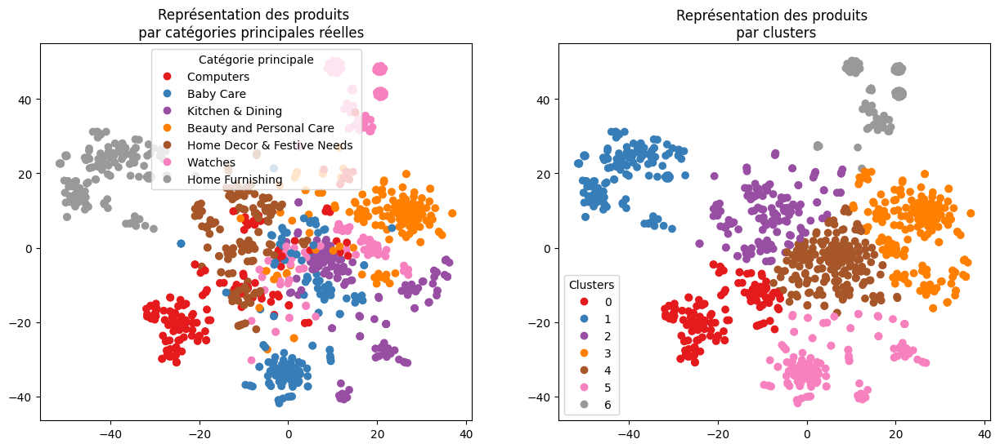

ARI :  0.4488
CountVectorizer (PCA): 
-----------------


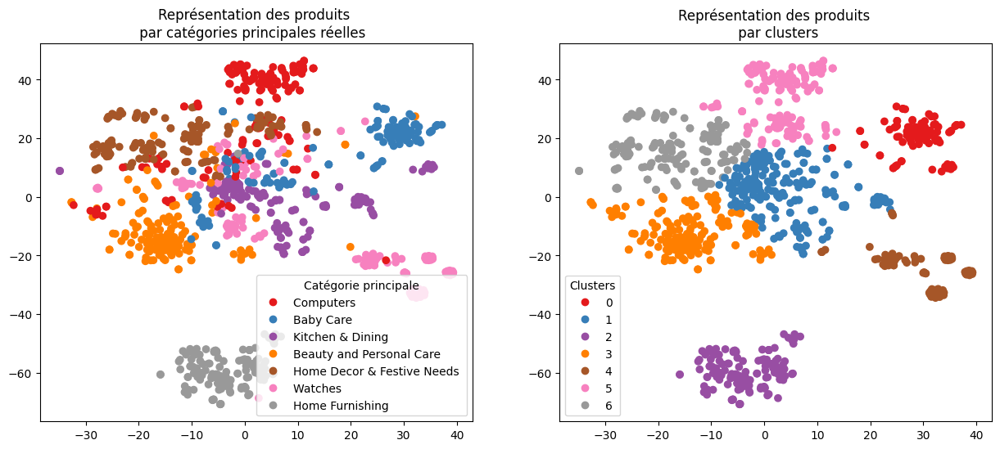

ARI :  0.5009


In [273]:
print("CountVectorizer : ")
print("-----------------")
TSNE_visu_fct(X_tsne1, y_cat_num, labels1, ARI1,(15,6))
print("CountVectorizer (PCA): ")
print("-----------------")
TSNE_visu_fct(X_tsne3, y_cat_num, labels3, ARI3,(15,6))

TF_IDF : 
-----------------


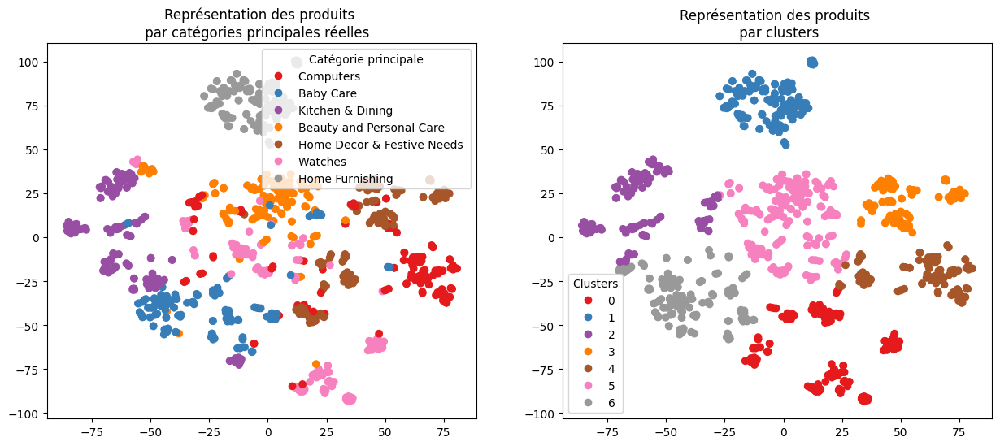

ARI :  0.4817
TF_IDF (PCA): 
-----------------


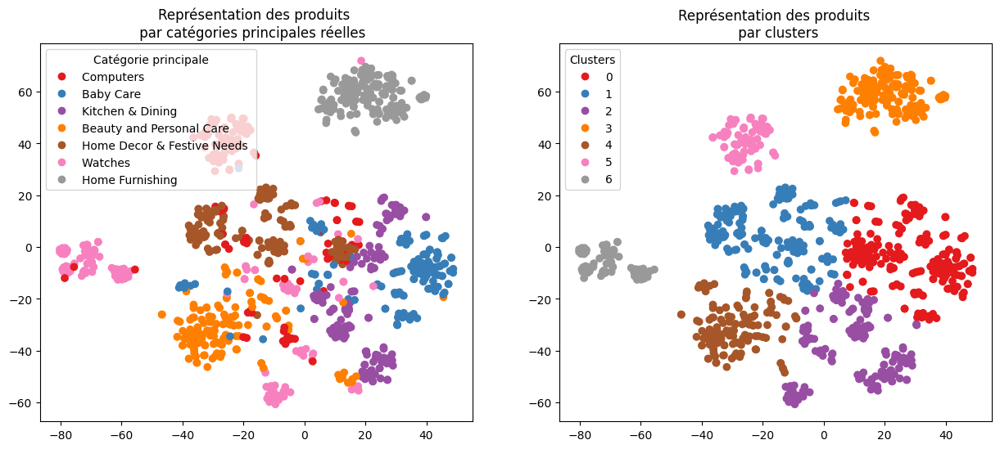

ARI :  0.4948


In [274]:
print("TF_IDF : ")
print("-----------------")
TSNE_visu_fct(X_tsne2, y_cat_num, labels2, ARI2,(15,6))
print("TF_IDF (PCA): ")
print("-----------------")
TSNE_visu_fct(X_tsne4, y_cat_num, labels4, ARI4,(15,6))

## Classification supervisé (MultinomialNB)

In [192]:
#Modeling: MultinomialNB model  works well with sparse features of text.

from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split


# creates a ML model 
def create_model(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = MultinomialNB()
    model = model.fit(X_train, y_train)
    return model, X_test, y_test

# model validation

from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score,classification_report

from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score, roc_curve, auc


def perf_class(model,X_test, y_test):
    ''' calculate Accuracy, F1_score and print the confusion matrix and the classification report of a model
    Parameters:
     model: a  fitted and transformed classification model
     X_test:test data
     y_test:test label
     returns:
    '''
    
    #prediction:
    y_pred=model.predict(X_test)
   
    # check accuracy 
    print('Accuracy: ',accuracy_score(y_test,y_pred ))
    # check F_measure 
    print('F_measure: ',f1_score(y_test,y_pred, average='weighted' ))

    #confusion matrix
    cm=metrics.confusion_matrix(y_test, y_pred)
    #print(cm)
    # Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
    cm_df = pd.DataFrame(cm,
                     index = ['0','1','2','3','4','5','6'], 
                     columns = ['0','1','2','3','4','5','6'])
    #Plotting the confusion matrix
    plt.figure(figsize=(5,4))
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Values')
    plt.xlabel('Predicted Values')
    plt.show()
    
    #disp = metrics.plot_confusion_matrix(model, X_test, y_test,
     #                            display_labels=l_cat,
     #                            cmap=plt.cm.Blues)
    #plt.show()

    print(classification_report(y_test, y_pred))
    
 


Bow:countvectorizer
Accuracy:  0.9047619047619048
F_measure:  0.9007682590572065


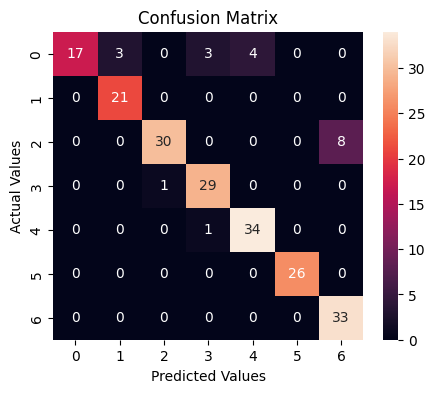

              precision    recall  f1-score   support

           0       1.00      0.63      0.77        27
           1       0.88      1.00      0.93        21
           2       0.97      0.79      0.87        38
           3       0.88      0.97      0.92        30
           4       0.89      0.97      0.93        35
           5       1.00      1.00      1.00        26
           6       0.80      1.00      0.89        33

    accuracy                           0.90       210
   macro avg       0.92      0.91      0.90       210
weighted avg       0.92      0.90      0.90       210



In [193]:
#Exécution
print('Bow:countvectorizer')    
model_b, X_test_b, y_test_b = create_model(cv_transform, y_cat_num)
perf_class(model_b, X_test_b, y_test_b )



TF_IDF
Accuracy:  0.9285714285714286
F_measure:  0.9292846317364231


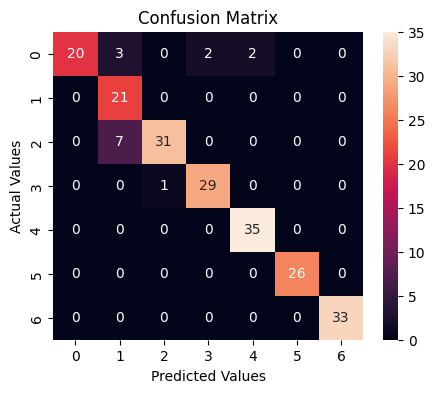

              precision    recall  f1-score   support

           0       1.00      0.74      0.85        27
           1       0.68      1.00      0.81        21
           2       0.97      0.82      0.89        38
           3       0.94      0.97      0.95        30
           4       0.95      1.00      0.97        35
           5       1.00      1.00      1.00        26
           6       1.00      1.00      1.00        33

    accuracy                           0.93       210
   macro avg       0.93      0.93      0.92       210
weighted avg       0.94      0.93      0.93       210



In [289]:

print('TF_IDF')    
model_t, X_test_t, y_test_t = create_model(ctf_transform, y_cat_num)
perf_class(model_t, X_test_t, y_test_t )


## Topic modeling using LDA (Pas encore finaliser)

- la matrice des topicsLDA convertit lq  matrice document-word en deux autres matrices :  Document Term matrix and Topic Word
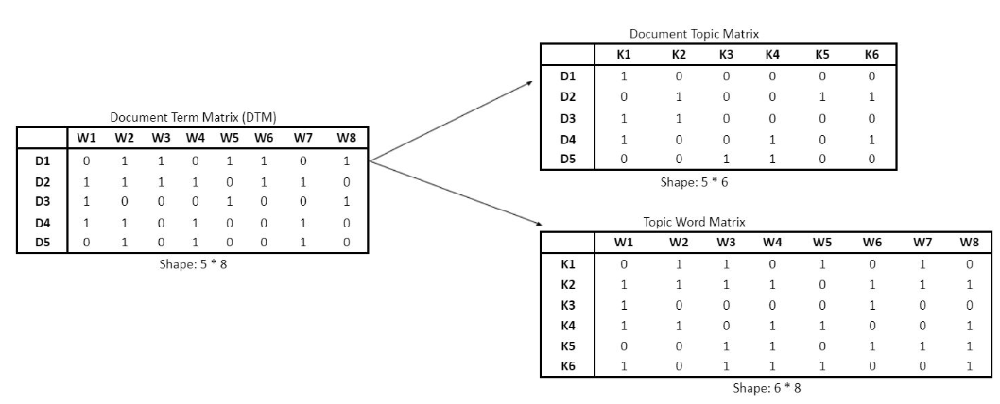

- The end goal of LDA is to find the most optimal representation of the Document-Topic matrix and the Topic-Word matrix to find the most optimized Document-Topic distribution and Topic-Word distribution.
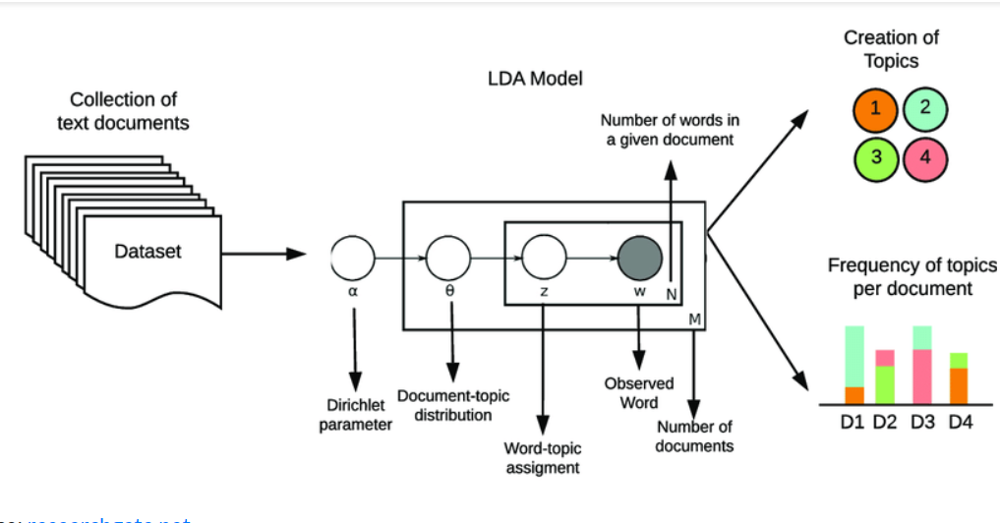
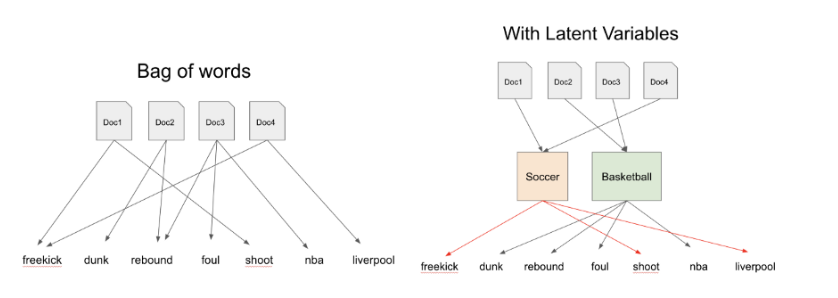

In [74]:
# Créer le modèle LDA
from sklearn.decomposition import LatentDirichletAllocation
n_topics=7# Ici j'ai pris le nombre de sujet égal au nombre de classes pour voir s'il ya une relation entre les deux
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

# Fitter sur les données
W1=lda.fit_transform(cv_transform)
#W1=lda.fit(cv_transform)

H1=lda.components_

In [75]:
# Affichage des 10 top mots par sujet
def display_topics(model, feature_names, no_top_words):
    '''afficher les tops mots par sujet
    parameters:
       model(model):model lda
       feature_names (string list):noms des features
       no_top_words(int):nombre des top mots
       returns:
       
    '''
    for topic_idx, topic in enumerate(model.components_):
        print("Topic {}:".format(topic_idx))
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words= 10
display_topics(lda, cvect.get_feature_names(), 10)

Topic 0:
oil showpiec ganesha idol lord skin keyboard use plant pot
Topic 1:
jewelleri pizza cutter frame vaniti carpet wheel jug water fruit
Topic 2:
onli ship free genuin cash buy product watch day replac
Topic 3:
design mug babi color featur print cotton specif pack materi
Topic 4:
laptop warranti skin shape usb mous pad combo power print
Topic 5:
sstudio gown surgic blanket hospit s0004 scrub pant ocean viscou
Topic 6:
quilt singl showpiec kadhai comfort product price dohar floral buddha


- Le découpage proprosé par l'algorithme LDA ne correspond pas exactement tout à fait à nos labels.
- Par exemple, on peut remarquer que les topics sont mélangés==> modifier le nombre de topics pour creuser le topic modeling

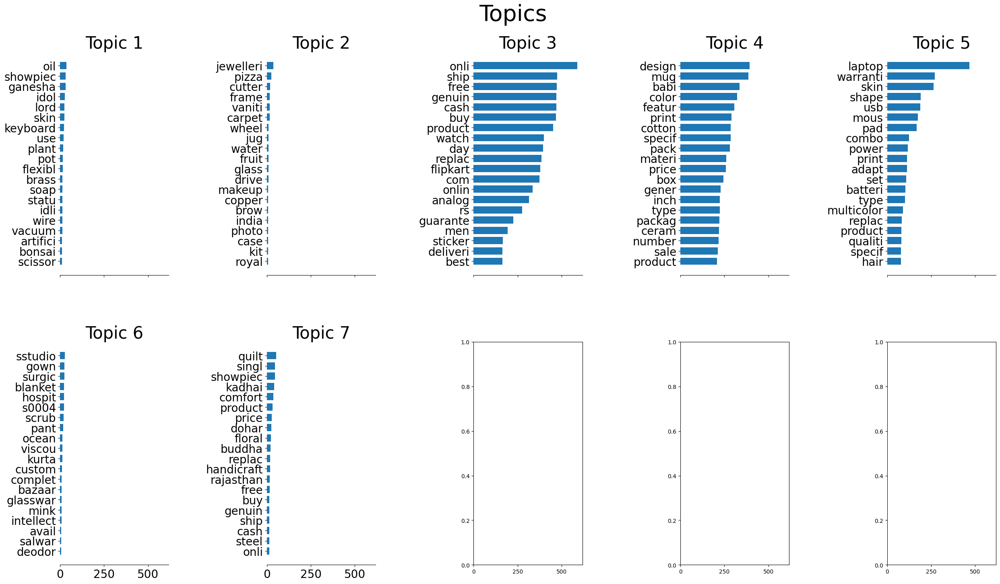

In [76]:

def plot_top_words(model, feature_names, no_top_words, title):
    fig, axes = plt.subplots(2, 5, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f"Topic {topic_idx +1}", fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

n_top_words = 20
tf_feature_names = ctf.get_feature_names_out()
plot_top_words(lda, tf_feature_names, n_top_words, "Topics")

In [77]:
colnames = ["Topic" + str(i) for i in range(lda.n_components)]
docnames = ["Doc" + str(i) for i in range(len(data_T.description_bow_lem_stem))]
df_doc_topic = pd.DataFrame(np.round(W1, 2), columns=colnames, index=docnames)
significant_topic = np.argmax(df_doc_topic.values, axis=1)
df_doc_topic['dominant_topic'] = significant_topic
df_doc_topic

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,dominant_topic
Doc0,0.00,0.00,0.00,0.99,0.00,0.00,0.00,3
Doc1,0.00,0.00,0.00,0.99,0.00,0.00,0.00,3
Doc2,0.00,0.00,0.00,0.99,0.00,0.00,0.00,3
Doc3,0.00,0.00,0.00,0.99,0.00,0.00,0.00,3
Doc4,0.00,0.00,0.00,0.99,0.00,0.00,0.00,3
...,...,...,...,...,...,...,...,...
Doc1045,0.00,0.00,0.00,1.00,0.00,0.00,0.00,3
Doc1046,0.00,0.00,0.00,0.99,0.00,0.00,0.00,3
Doc1047,0.00,0.00,0.98,0.00,0.00,0.00,0.00,2
Doc1048,0.00,0.00,0.97,0.00,0.00,0.00,0.00,2


# 3. Word embedding <a class="anchor" id="we"></a>
<br>
**BOW et TF_IDF**:<br>
L’efficacité de ces méthodes diffère selon le cas d’application. Toutefois, elles présentent deux principales limites :<br>
- Plus le vocabulaire du corpus est riche, plus la taille des vecteurs est grande, ce qui peut représenter un problème pour les modèles d’apprentissage utilisées dans l’étape suivante.<br>
- Le comptage d’occurrence des mots ne permet pas de rendre compte de leur agencement et donc du sens des phrases.<br>
Il existe une autre approche qui permet de remédier à ces problèmes :  Word Embedding.<br>
**Word Embedding**<br>
-Elle consiste à construire des vecteurs de taille fixe qui prennent en compte le contexte dans lequel se trouvent les mots. 
## 3.1.Word2Vec <a class="anchor" id="wc"></a>

In [80]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

Word embeddings give us a way to use an efficient, dense representation in which similar words have a similar encoding.

## 3.1 Word2Vec<a class="anchor" id="wv"></a>

In [128]:
#création du modèle word2vec
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = data_T['description_bow_lem_stem'].to_list()
#Convert a document into a list of lowercase tokens, ignoring tokens that are too short or too long.
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [129]:
sentences

[['key',
  'featur',
  'eleg',
  'polyest',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'floral',
  'curtain',
  'eleg',
  'polyest',
  'multicolor',
  'abstract',
  'eyelet',
  'door',
  'curtain',
  'height',
  'pack',
  'price',
  'thi',
  'curtain',
  'enhanc',
  'look',
  'interiors',
  'thi',
  'curtain',
  'made',
  'high',
  'qualiti',
  'polyest',
  'fabric',
  'it',
  'featur',
  'eyelet',
  'style',
  'stitch',
  'metal',
  'ring',
  'it',
  'make',
  'room',
  'environ',
  'romant',
  'loving',
  'thi',
  'curtain',
  'ant',
  'wrinkl',
  'anti',
  'shrinkag',
  'eleg',
  'apparance',
  'home',
  'bright',
  'modernist',
  'appeal',
  'design',
  'the',
  'surreal',
  'attent',
  'sure',
  'steal',
  'heart',
  'these',
  'contemporari',
  'eyelet',
  'valanc',
  'curtain',
  'slide',
  'smoothli',
  'draw',
  'apart',
  'first',
  'thing',
  'morn',
  'welcom',
  'bright',
  'sun',
  'ray',
  'want',
  'wish',
  'good',
  'morn',
  'whole',
  'world'

In [130]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4170
Word2Vec trained


In [131]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4171


### Création de la matrice d'embedding

In [132]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4171, 300)


### Création du modèle d'embedding

In [133]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding_3 (Embedding)     (None, 24, 300)           1251300   
                                                                 
 global_average_pooling1d_3   (None, 300)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 1,251,300
Trainable params: 1,251,300
Non-trainable params: 0
_________________________________________________________________


### Exécution du modèle

In [134]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 3ms/step


(1050, 300)

### Graphiques

TSNE (Word Embedding ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 300)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2094 time :  8.0 perplexity :  5


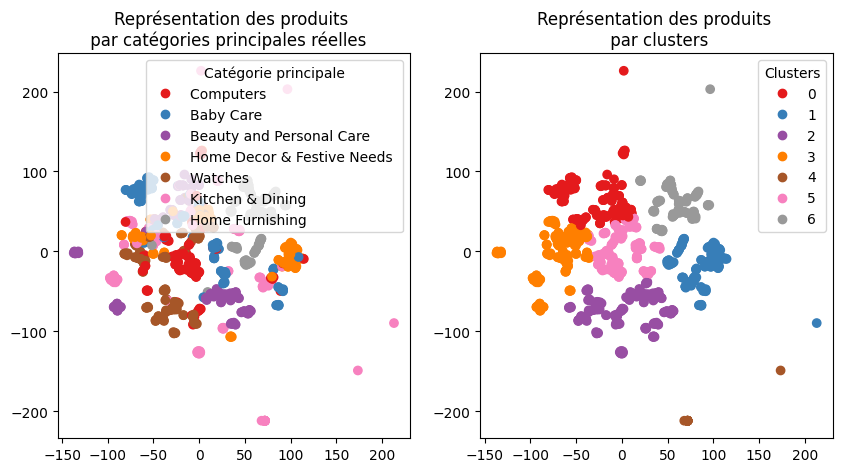

ARI :  0.2094
Dimensions feature  avant réduction TSNE : (1050, 300)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2204 time :  6.0 perplexity :  10


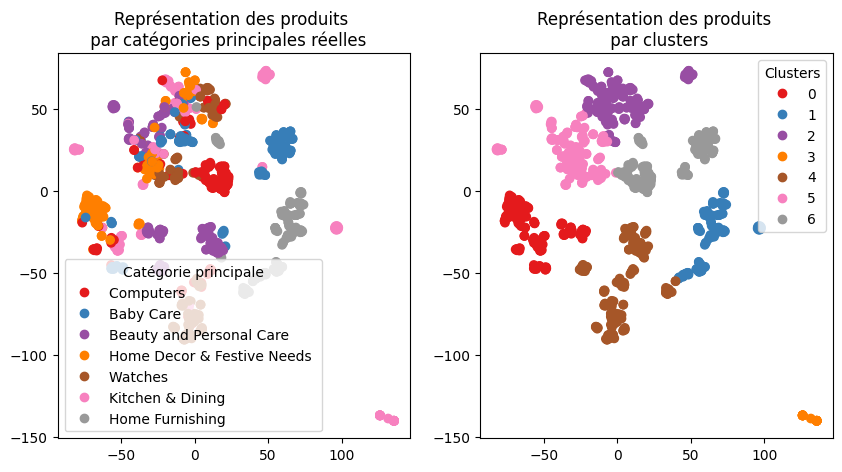

ARI :  0.2204
Dimensions feature  avant réduction TSNE : (1050, 300)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2084 time :  6.0 perplexity :  20


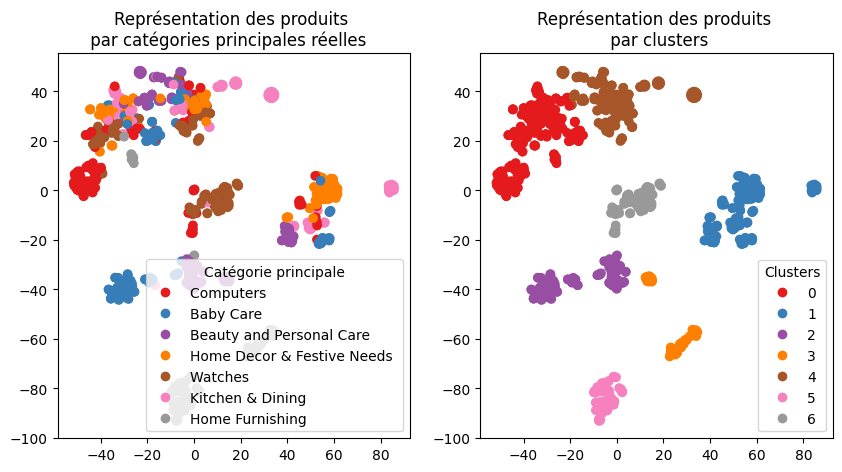

ARI :  0.2084
Dimensions feature  avant réduction TSNE : (1050, 300)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2792 time :  7.0 perplexity :  30


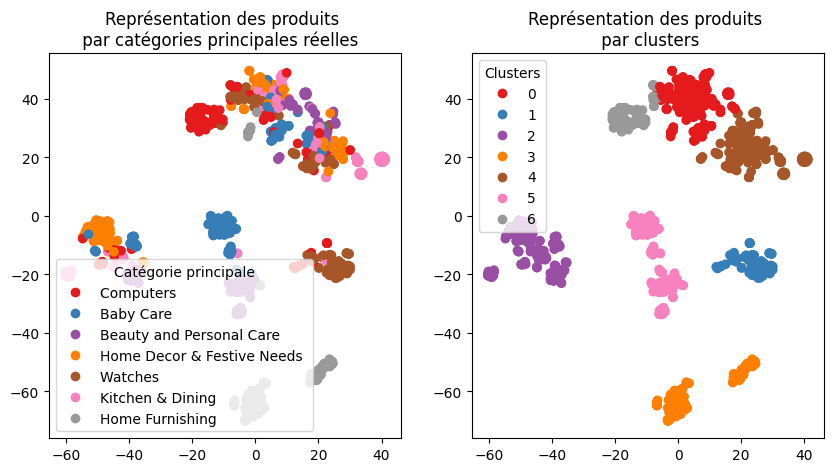

ARI :  0.2792
Dimensions feature  avant réduction TSNE : (1050, 300)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2802 time :  8.0 perplexity :  50


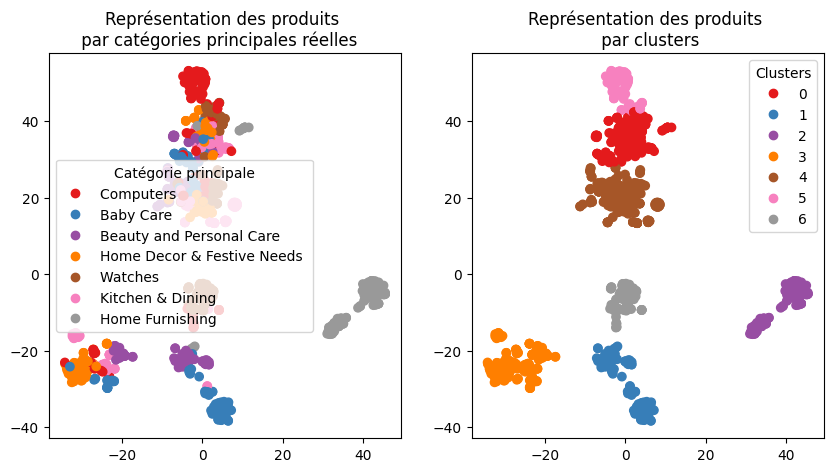

ARI :  0.2802


In [135]:
per=[5,10,20,30,50]
print("TSNE (Word Embedding ): ")
print("--------")
tsne_param(embeddings,per)

Dimensions feature  avant réduction TSNE : (1050, 300)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2792 time :  6.0 perplexity :  30


,cluster,nb_feature
0,0,202
1,1,100
2,2,183
3,3,131
4,4,190
5,5,155
6,6,89


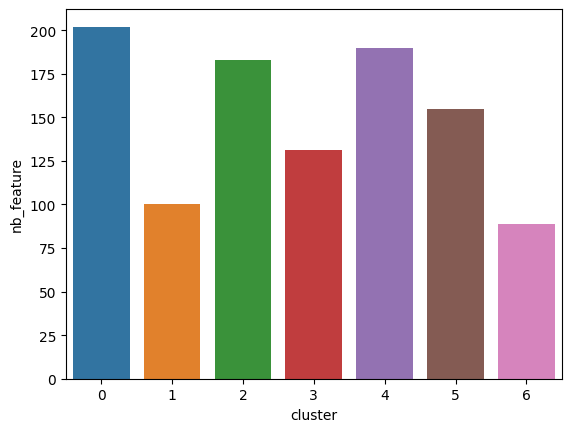

In [235]:
ARI, X_tsne, labels = ARI_fct(embeddings,30)
df5=feature_cluster(X_tsne,labels)
print()

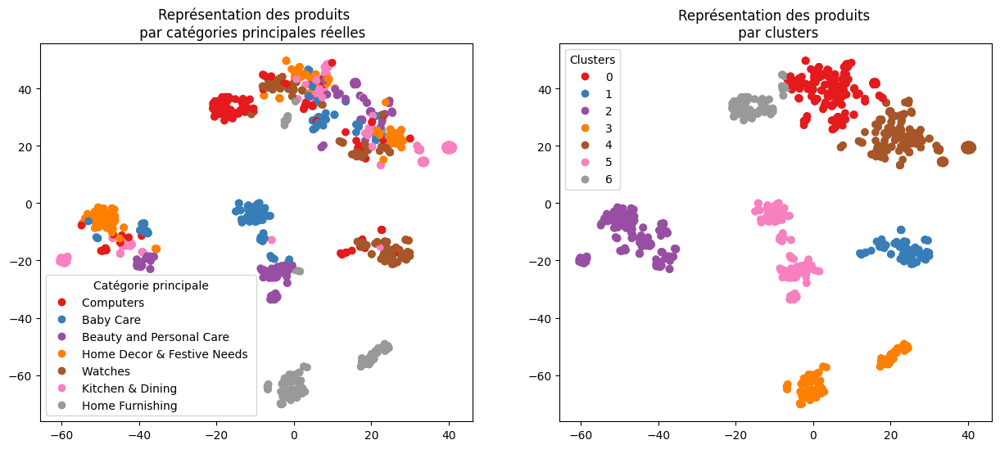

ARI :  0.2792


In [236]:
TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI,(15,6))

In [162]:
def pca_transform(features,technique):
    '''reduces dimensionality using pca
    parameters:
        features (int matrix):features to be reduced
        technique(string): technique used for feature extraction
    return:
        fear_pca(int matrix): reduced features
    '''
    pca = decomposition.PCA(n_components=0.95)
    print(f'Dimensions feature {technique} avant réduction PCA {features.shape}')
    feat_pca = pca.fit_transform(features)
    print(f'Dimensions feature {technique} après réduction PCA {feat_pca.shape} ')
    return feat_pca

In [163]:
embeddings_pca=pca_transform(embeddings,'Word2Vect')

Dimensions feature Word2Vect avant réduction PCA (1050, 300)
Dimensions feature Word2Vect après réduction PCA (1050, 25) 


TSNE (Word Embedding ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 25)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2136 time :  7.0 perplexity :  5


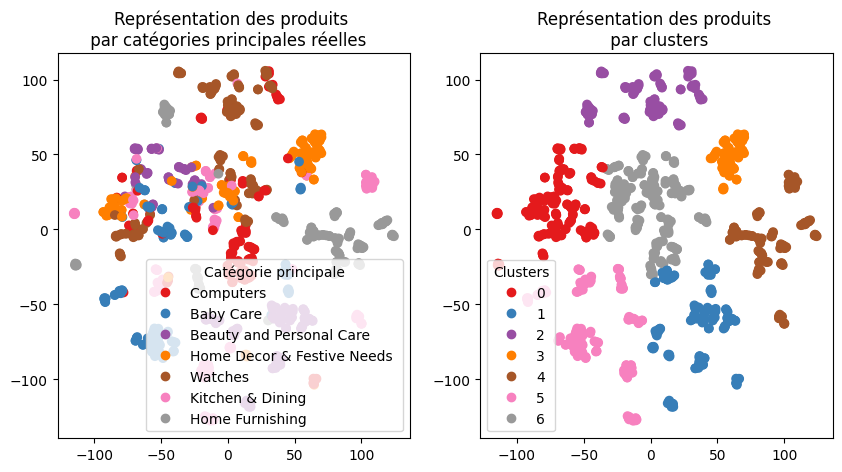

ARI :  0.2136
Dimensions feature  avant réduction TSNE : (1050, 25)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2468 time :  6.0 perplexity :  10


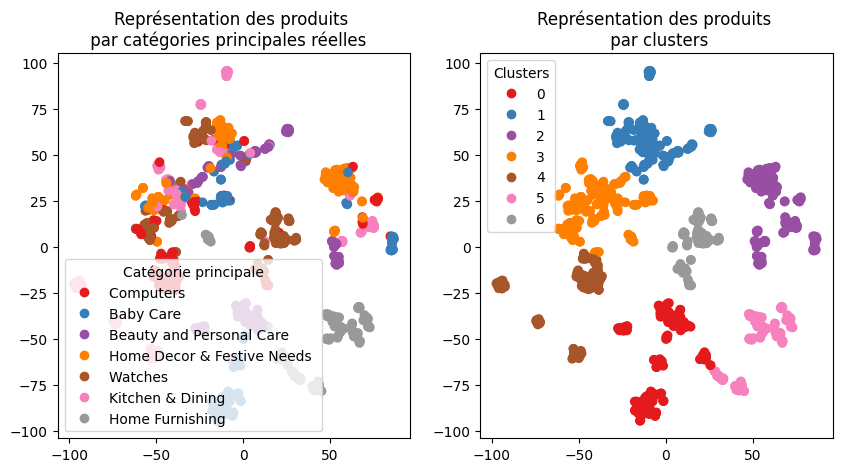

ARI :  0.2468
Dimensions feature  avant réduction TSNE : (1050, 25)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2141 time :  6.0 perplexity :  20


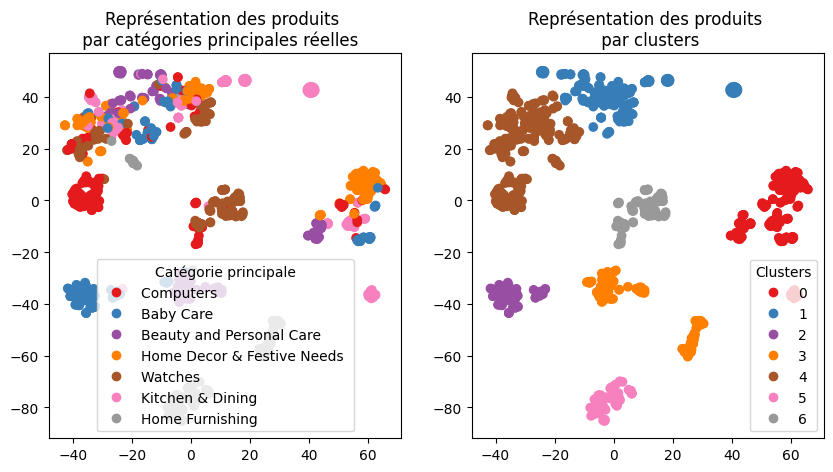

ARI :  0.2141
Dimensions feature  avant réduction TSNE : (1050, 25)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2633 time :  6.0 perplexity :  30


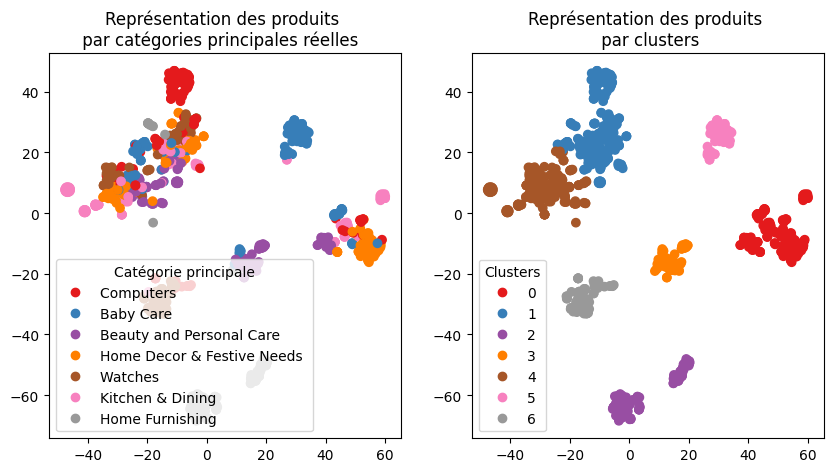

ARI :  0.2633
Dimensions feature  avant réduction TSNE : (1050, 25)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2812 time :  8.0 perplexity :  50


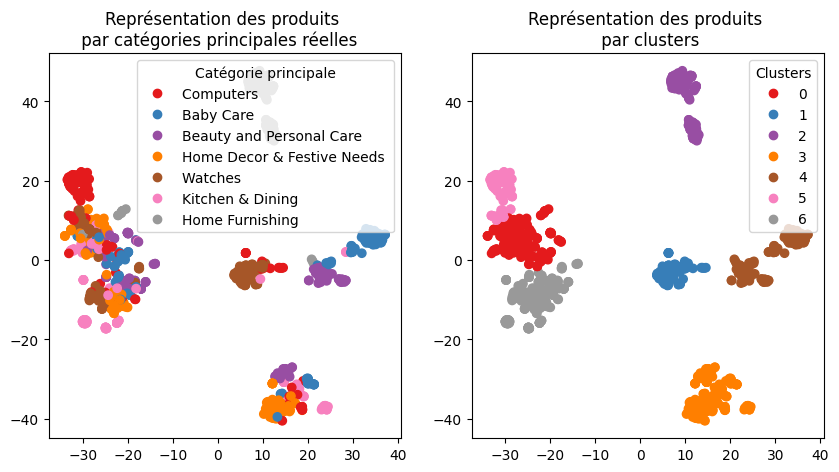

ARI :  0.2812


In [103]:
per=[5,10,20,30,50]
print("TSNE (Word Embedding ): ")
print("--------")
tsne_param(embeddings_pca,per)

## Classification

### Kmeans sur features réduits

Dimensions feature  avant réduction TSNE : (1050, 25)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2812 time :  8.0 perplexity :  50


,cluster,nb_feature
0,0,191
1,1,100
2,2,131
3,3,183
4,4,155
5,5,98
6,6,192


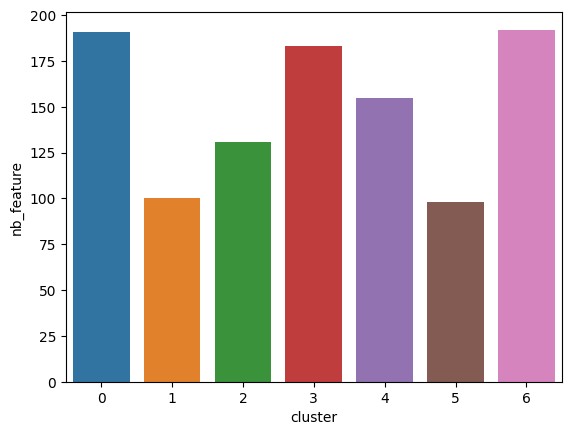

In [237]:
ARI7, X_tsne7, labels7 = ARI_fct(embeddings_pca,50)
df7=feature_cluster(X_tsne7,labels7)
print()

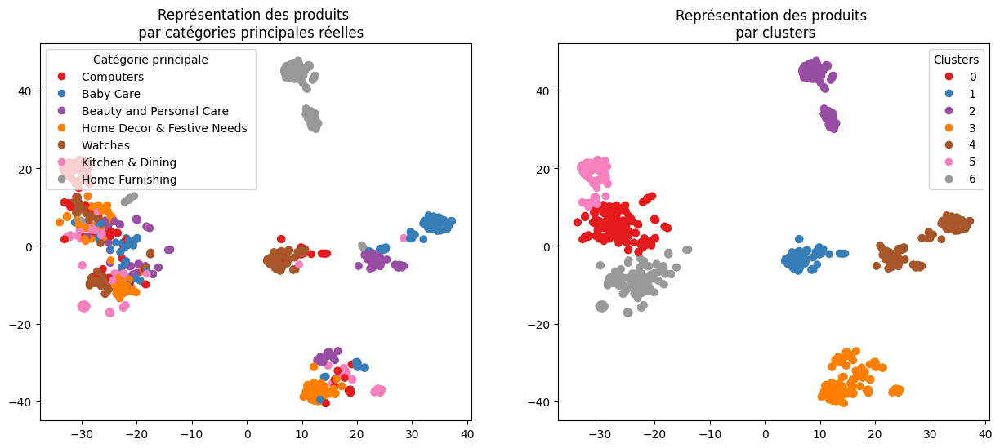

ARI :  0.2812


In [106]:
TSNE_visu_fct(X_tsne7, y_cat_num, labels7, ARI7,(15,6))

### Classification supervisée


In [139]:
# creates a RF ML model 
from sklearn.ensemble import RandomForestClassifier
def create_RF_model(X, y,nb):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = RandomForestClassifier(n_estimators = nb, criterion = 'entropy', random_state = 42)

    model = model.fit(X_train, y_train)
    return model, X_test, y_test

Word2Vect
Accuracy:  0.9142857142857143
F_measure:  0.9128688231493953


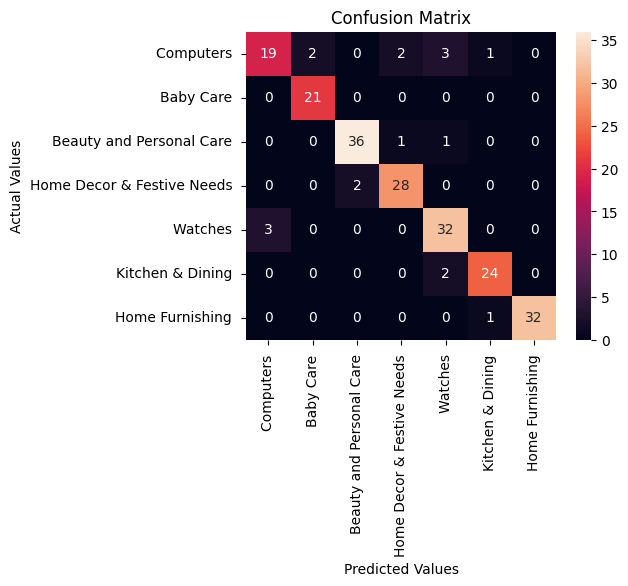

              precision    recall  f1-score   support

           0       0.86      0.70      0.78        27
           1       0.91      1.00      0.95        21
           2       0.95      0.95      0.95        38
           3       0.90      0.93      0.92        30
           4       0.84      0.91      0.88        35
           5       0.92      0.92      0.92        26
           6       1.00      0.97      0.98        33

    accuracy                           0.91       210
   macro avg       0.91      0.91      0.91       210
weighted avg       0.91      0.91      0.91       210



In [145]:
#Exécution
print('Word2Vect')    
model_w, X_test_w, y_test_w = create_RF_model(embeddings, y_cat_num,20)
perf_class(model_w, X_test_w, y_test_w )

Word2Vect (pca)
Accuracy:  0.9
F_measure:  0.8986031548962322


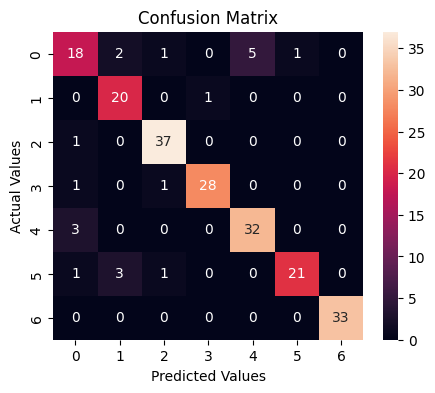

              precision    recall  f1-score   support

           0       0.75      0.67      0.71        27
           1       0.80      0.95      0.87        21
           2       0.93      0.97      0.95        38
           3       0.97      0.93      0.95        30
           4       0.86      0.91      0.89        35
           5       0.95      0.81      0.88        26
           6       1.00      1.00      1.00        33

    accuracy                           0.90       210
   macro avg       0.89      0.89      0.89       210
weighted avg       0.90      0.90      0.90       210



In [238]:
#Exécution
print('Word2Vect (pca)')    
model_wp, X_test_wp, y_test_wp = create_RF_model(embeddings_pca, y_cat_num,20)
perf_class(model_wp, X_test_wp, y_test_wp )

## 3.2.BERT<a class="anchor" id="bert"></a>

In [146]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

In [147]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Num GPUs Available:  0
True


## Fonctions communes

In [150]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

## BERT HuggingFace

### 'bert-base-uncased'

In [149]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = data_T['description_dl'].to_list()

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/536M [00:00<?, ?B/s]

In [156]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

1/1 [==============================] - 1s 588ms/step
temps traitement :  85.0


TSNE (Bert HuggingFace :bert-base-uncased'): 
--------
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2896 time :  7.0 perplexity :  5


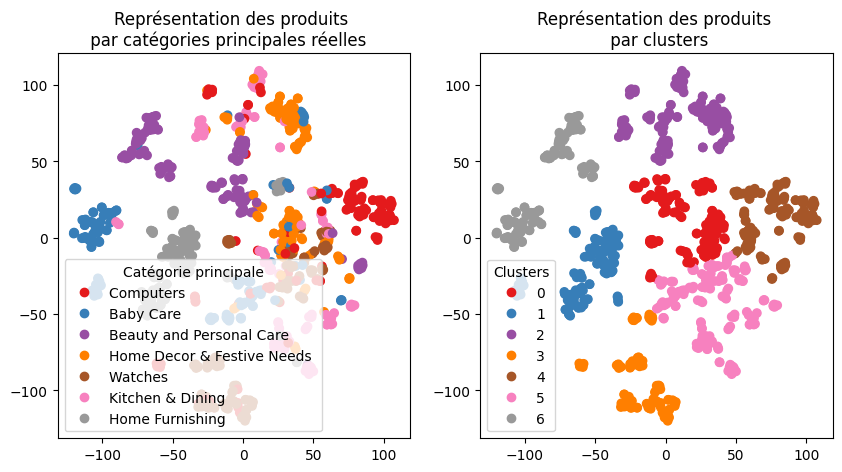

ARI :  0.2896
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3278 time :  6.0 perplexity :  10


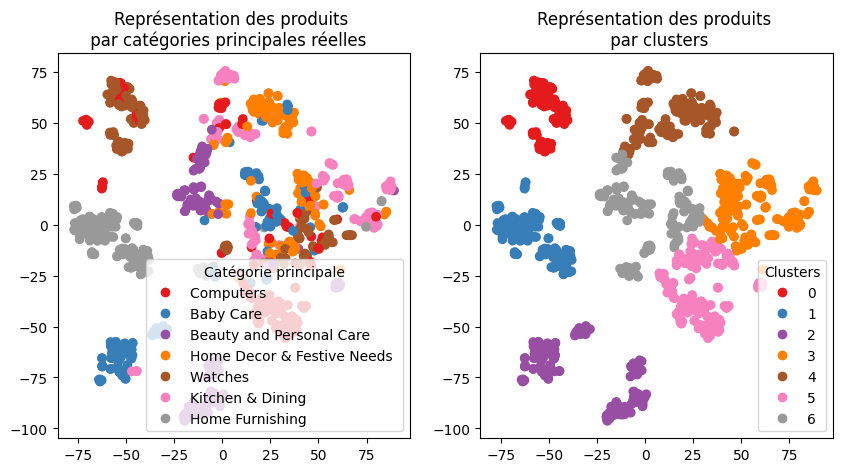

ARI :  0.3278
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3705 time :  6.0 perplexity :  20


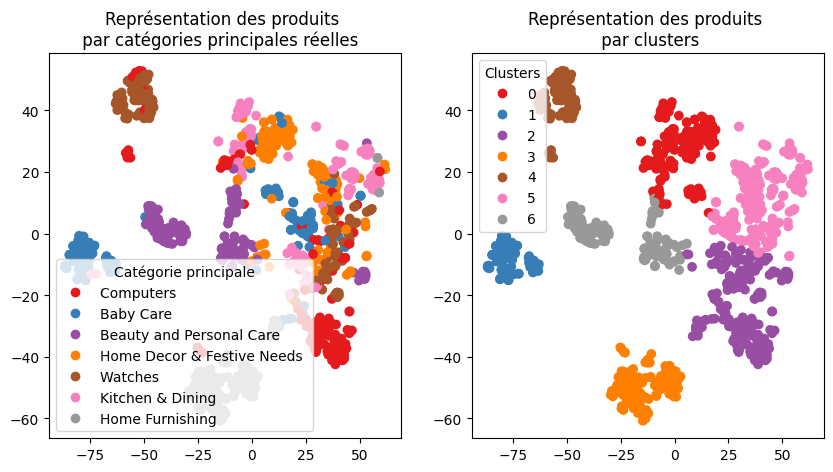

ARI :  0.3705
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3265 time :  7.0 perplexity :  30


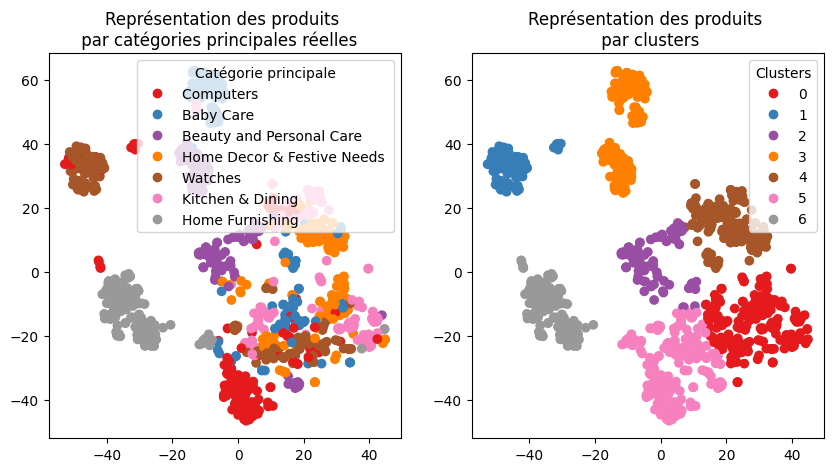

ARI :  0.3265
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3201 time :  8.0 perplexity :  50


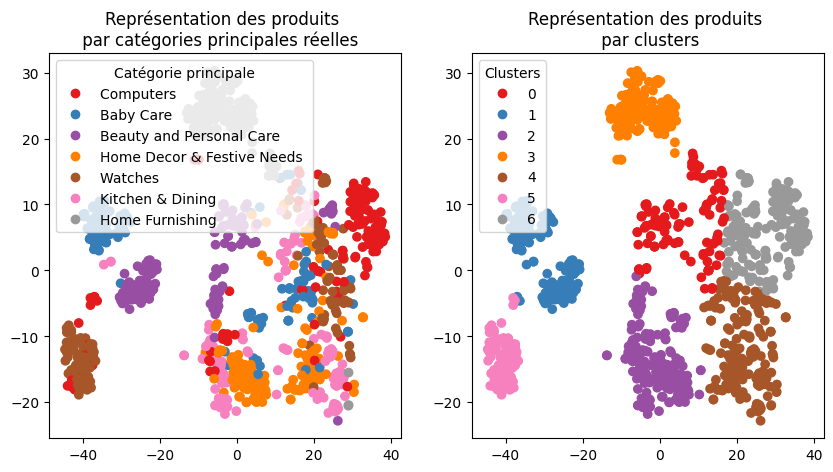

ARI :  0.3201


In [157]:
per=[5,10,20,30,50]
print("TSNE (Bert HuggingFace :bert-base-uncased'): ")
print("--------")
tsne_param(features_bert,per)

Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3705 time :  6.0 perplexity :  20


,cluster,nb_feature
0,0,174
1,1,82
2,2,211
3,3,140
4,4,94
5,5,216
6,6,133


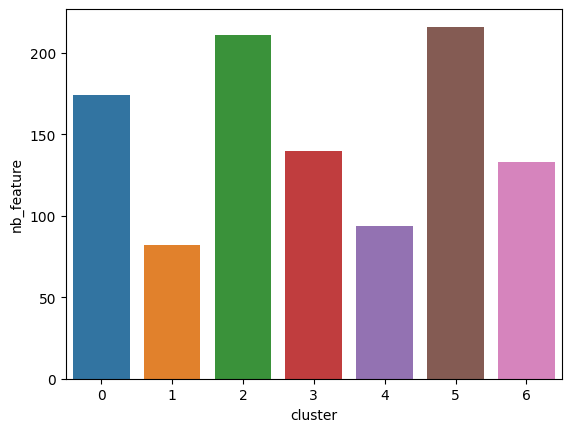

In [239]:
ARI9, X_tsne9, labels9 = ARI_fct(features_bert,20)
df9=feature_cluster(X_tsne9,labels9)


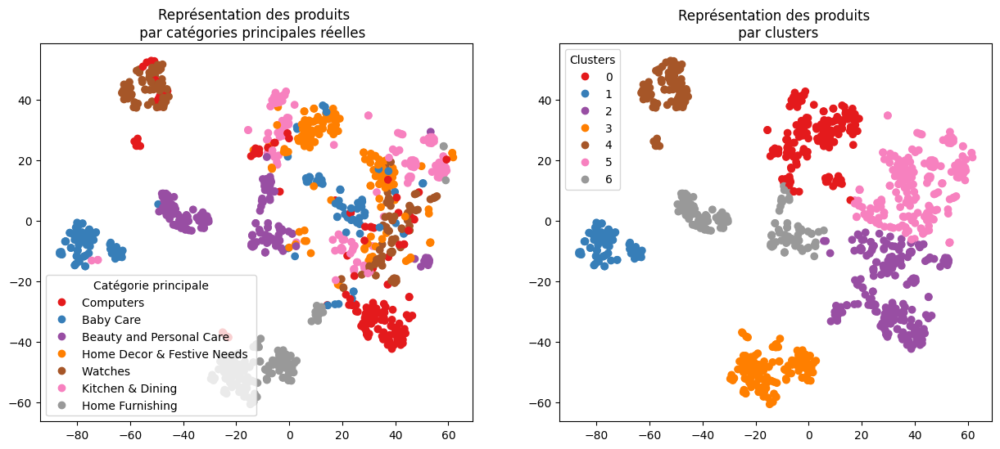

ARI :  0.3705


In [240]:
TSNE_visu_fct(X_tsne9, y_cat_num, labels9, ARI9,(15,6))

In [165]:
#PCA

features_bert_pca=pca_transform(features_bert,'Bert HuggingFace :bert-base-uncased')

Dimensions feature Bert HuggingFace :bert-base-uncased avant réduction PCA (1050, 768)
Dimensions feature Bert HuggingFace :bert-base-uncased après réduction PCA (1050, 152) 


TSNE (Bert HuggingFace :bert-base-uncased') PCA: 
--------
Dimensions feature  avant réduction TSNE : (1050, 152)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3453 time :  7.0 perplexity :  5


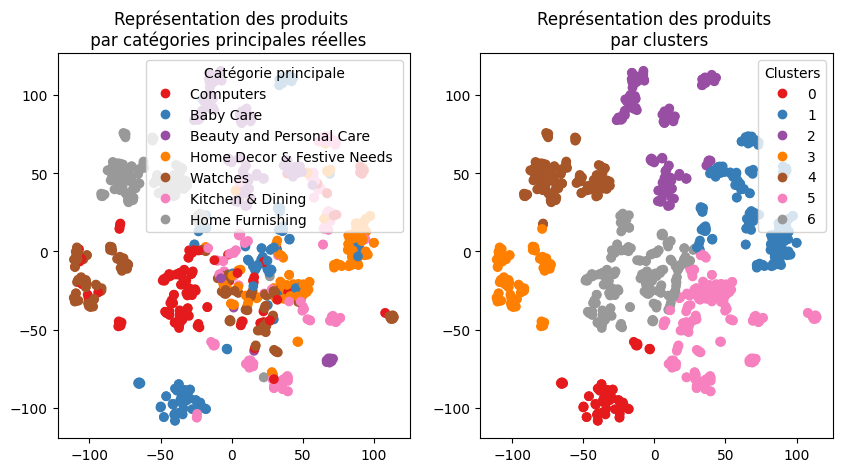

ARI :  0.3453
Dimensions feature  avant réduction TSNE : (1050, 152)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3339 time :  6.0 perplexity :  10


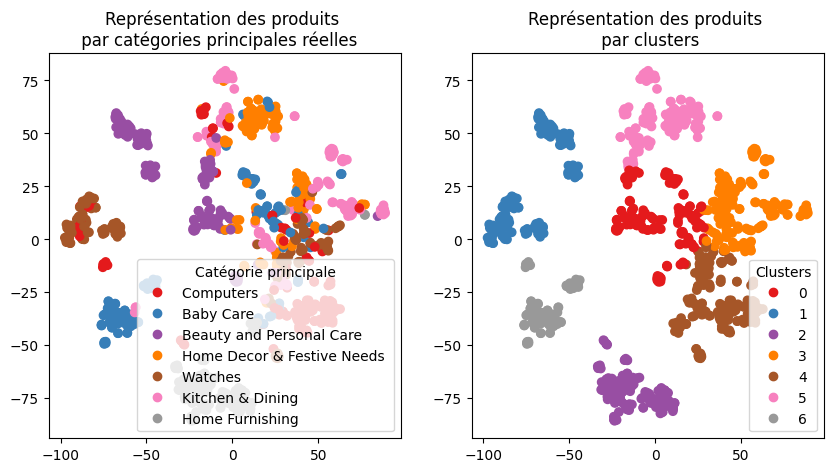

ARI :  0.3339
Dimensions feature  avant réduction TSNE : (1050, 152)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3025 time :  6.0 perplexity :  20


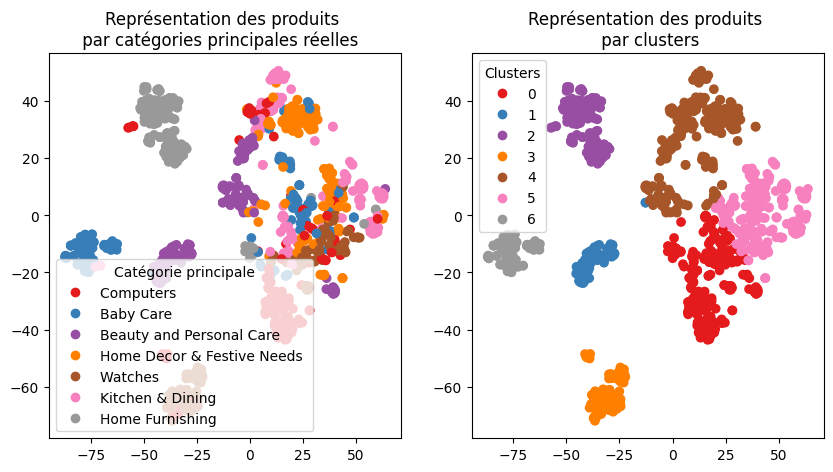

ARI :  0.3025
Dimensions feature  avant réduction TSNE : (1050, 152)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3211 time :  7.0 perplexity :  30


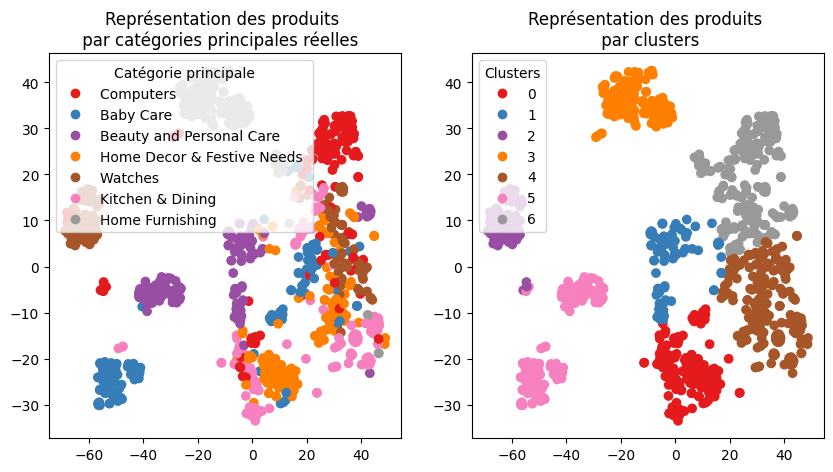

ARI :  0.3211
Dimensions feature  avant réduction TSNE : (1050, 152)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3146 time :  8.0 perplexity :  50


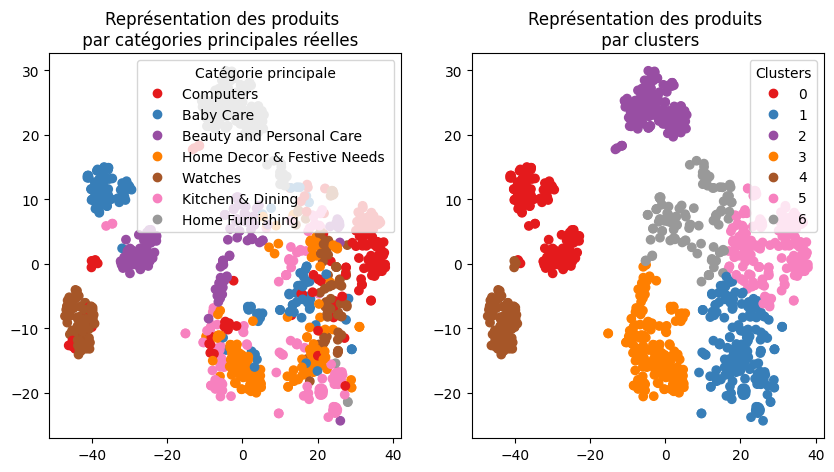

ARI :  0.3146


In [166]:
print("TSNE (Bert HuggingFace :bert-base-uncased') PCA: ")
print("--------")
tsne_param(features_bert_pca,per)

Dimensions feature  avant réduction TSNE : (1050, 152)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3453 time :  5.0 perplexity :  5


,cluster,nb_feature
0,0,74
1,1,187
2,2,143
3,3,96
4,4,137
5,5,193
6,6,220


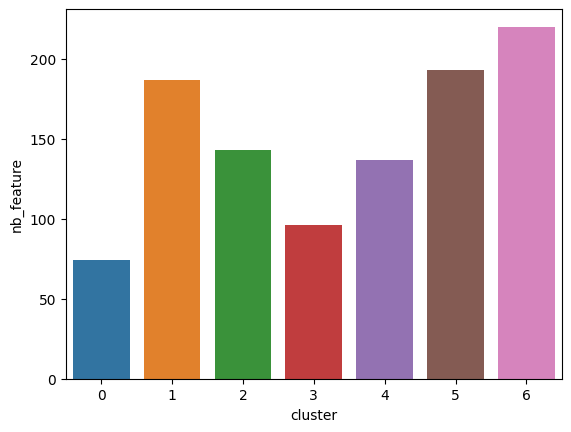

In [241]:
ARI8, X_tsne8, labels8 = ARI_fct(features_bert_pca,5)
df8=feature_cluster(X_tsne8,labels8)


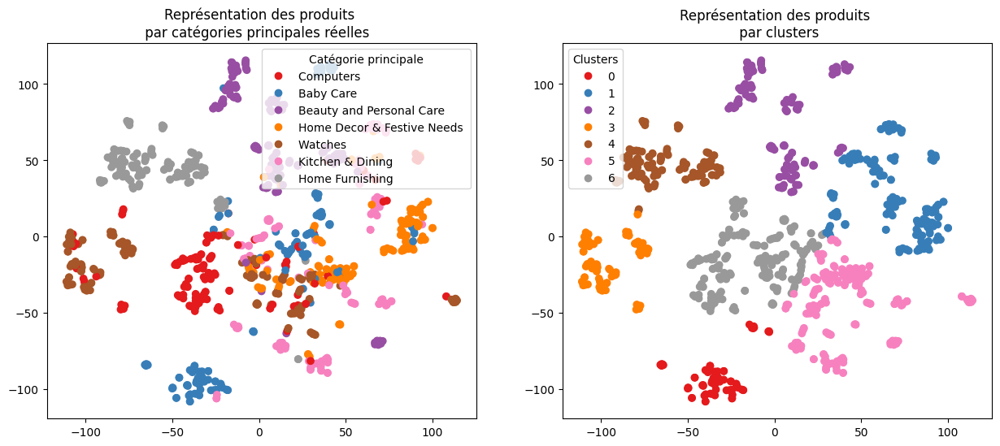

ARI :  0.3453


In [242]:
TSNE_visu_fct(X_tsne8, y_cat_num, labels8, ARI8,(15,6))

Bert HuggingFace :bert-base-uncased
Accuracy:  0.8857142857142857
F_measure:  0.8834265165728581


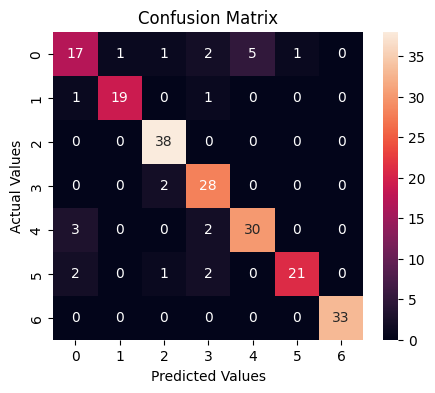

              precision    recall  f1-score   support

           0       0.74      0.63      0.68        27
           1       0.95      0.90      0.93        21
           2       0.90      1.00      0.95        38
           3       0.80      0.93      0.86        30
           4       0.86      0.86      0.86        35
           5       0.95      0.81      0.88        26
           6       1.00      1.00      1.00        33

    accuracy                           0.89       210
   macro avg       0.89      0.88      0.88       210
weighted avg       0.89      0.89      0.88       210



In [207]:
print('Bert HuggingFace :bert-base-uncased')    
model_b1, X_test_b1, y_test_b1 = create_RF_model(features_bert, y_cat_num,200)
perf_class(model_b1, X_test_b1, y_test_b1 )

Bert HuggingFace :bert-base-uncased pca
Accuracy:  0.8809523809523809
F_measure:  0.8793691096168446


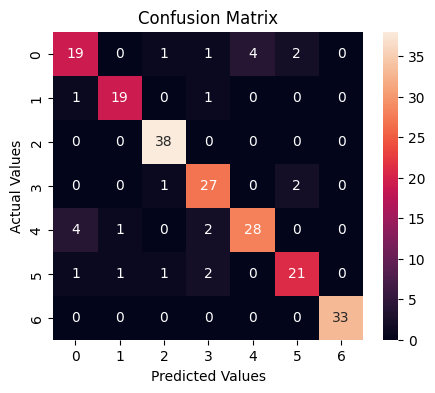

              precision    recall  f1-score   support

           0       0.76      0.70      0.73        27
           1       0.90      0.90      0.90        21
           2       0.93      1.00      0.96        38
           3       0.82      0.90      0.86        30
           4       0.88      0.80      0.84        35
           5       0.84      0.81      0.82        26
           6       1.00      1.00      1.00        33

    accuracy                           0.88       210
   macro avg       0.87      0.87      0.87       210
weighted avg       0.88      0.88      0.88       210



In [243]:
print('Bert HuggingFace :bert-base-uncased pca')    
model_b1a, X_test_b1a, y_test_b1a = create_RF_model(features_bert_pca, y_cat_num,200)
perf_class(model_b1a, X_test_b1a, y_test_b1a )

### 'cardiffnlp/twitter-roberta-base-sentiment'
* Modèle pré-entraîné sur des tweets pour l'analyse de sentiment = particulièrement adapté au contexte

In [171]:
max_length = 64
batch_size = 10
model_type2 = 'cardiffnlp/twitter-roberta-base-sentiment'
model2 = TFAutoModel.from_pretrained(model_type)
sentences = data_T['description_dl'].to_list()

In [172]:
features_bert2, last_hidden_states_tot2 = feature_BERT_fct(model2, model_type2, sentences, 
                                                         max_length, batch_size, mode='HF')

1/1 [==============================] - 1s 708ms/step
temps traitement :  83.0


TSNE (cardiffnlp/twitter-roberta-base-sentiment): 
--------
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2218 time :  8.0 perplexity :  5


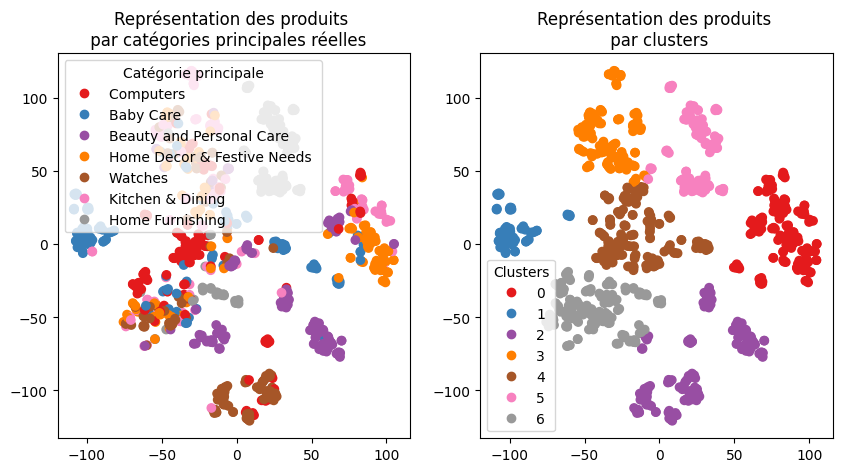

ARI :  0.2218
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2153 time :  6.0 perplexity :  10


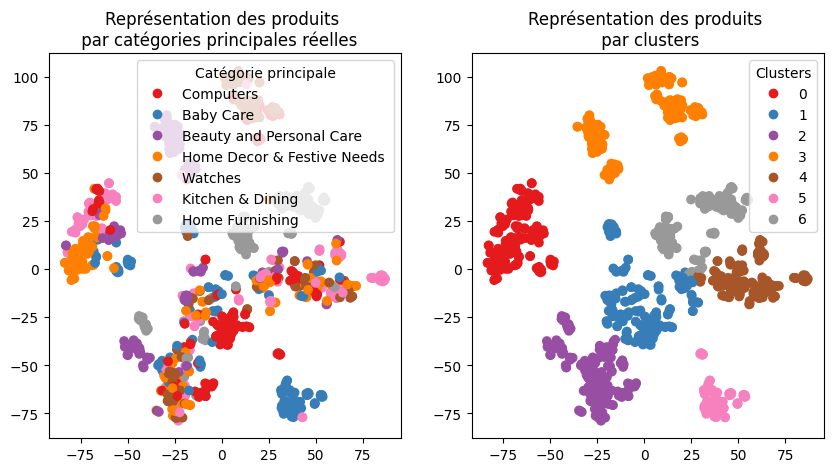

ARI :  0.2153
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.1441 time :  7.0 perplexity :  20


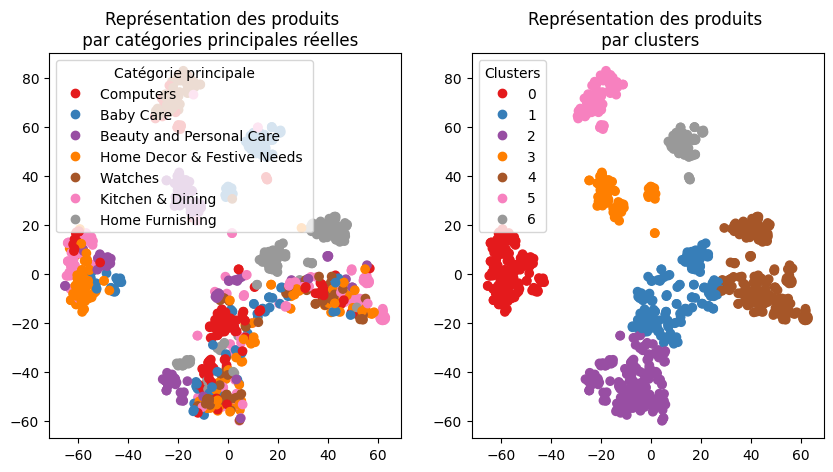

ARI :  0.1441
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2245 time :  7.0 perplexity :  30


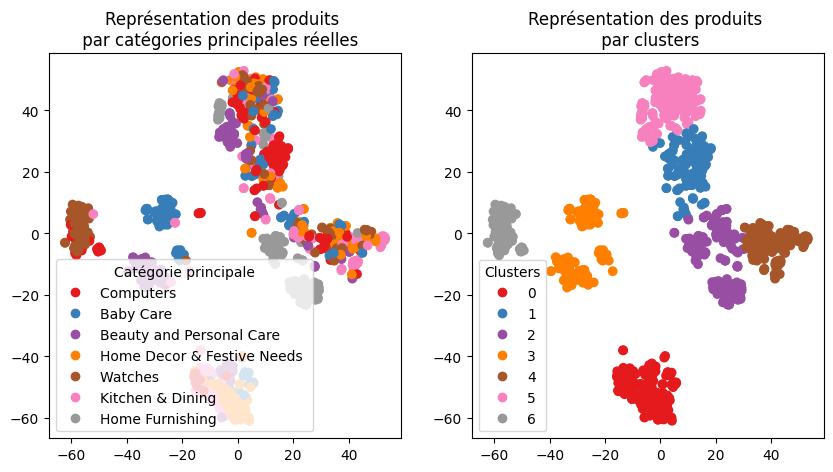

ARI :  0.2245
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2233 time :  9.0 perplexity :  50


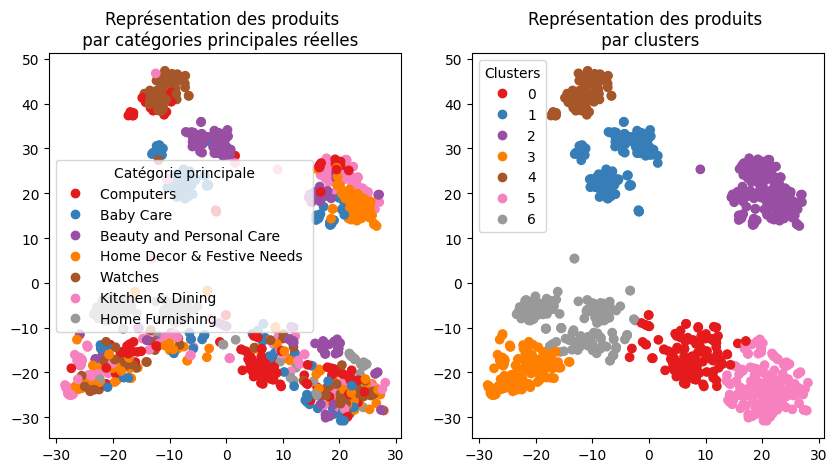

ARI :  0.2233


In [173]:
per=[5,10,20,30,50]
print("TSNE (cardiffnlp/twitter-roberta-base-sentiment): ")
print("--------")
tsne_param(features_bert2,per)

Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2218 time :  5.0 perplexity :  5


,cluster,nb_feature
0,0,173
1,1,69
2,2,173
3,3,142
4,4,181
5,5,125
6,6,187


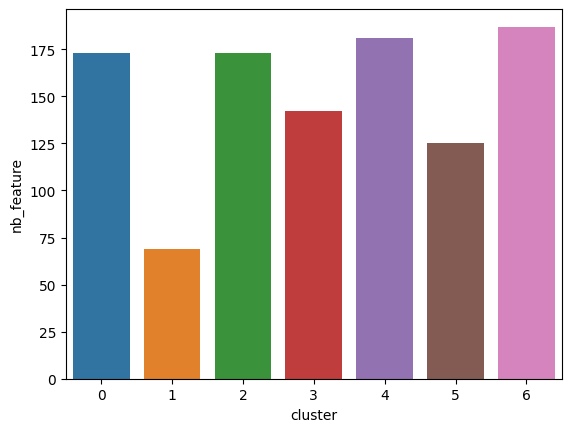

In [244]:
ARI10, X_tsne10, labels10 = ARI_fct(features_bert2,5)
df10=feature_cluster(X_tsne10,labels10)

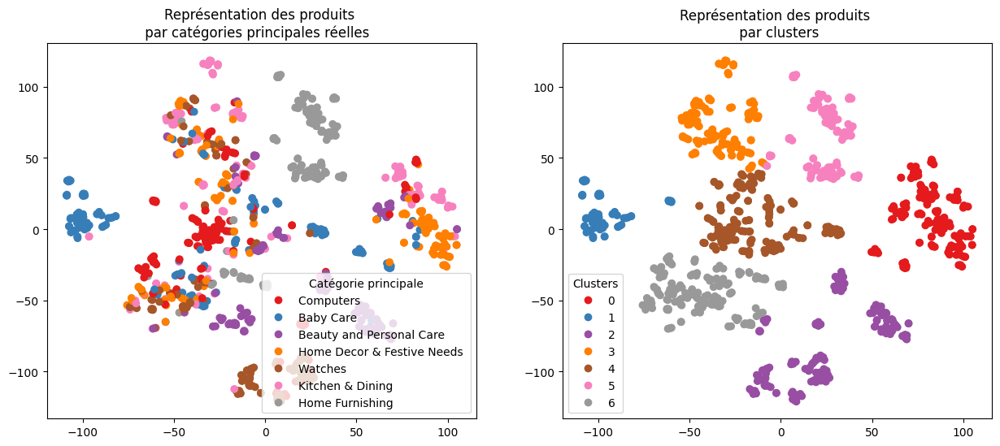

ARI :  0.2218


In [176]:
TSNE_visu_fct(X_tsne10, y_cat_num, labels10, ARI10,(15,6))

In [177]:
features_bert2_pca=pca_transform(features_bert2,'cardiffnlp/twitter-roberta-base-sentiment')

Dimensions feature cardiffnlp/twitter-roberta-base-sentiment avant réduction PCA (1050, 768)
Dimensions feature cardiffnlp/twitter-roberta-base-sentiment après réduction PCA (1050, 68) 


Dimensions feature  avant réduction TSNE : (1050, 68)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2207 time :  7.0 perplexity :  5


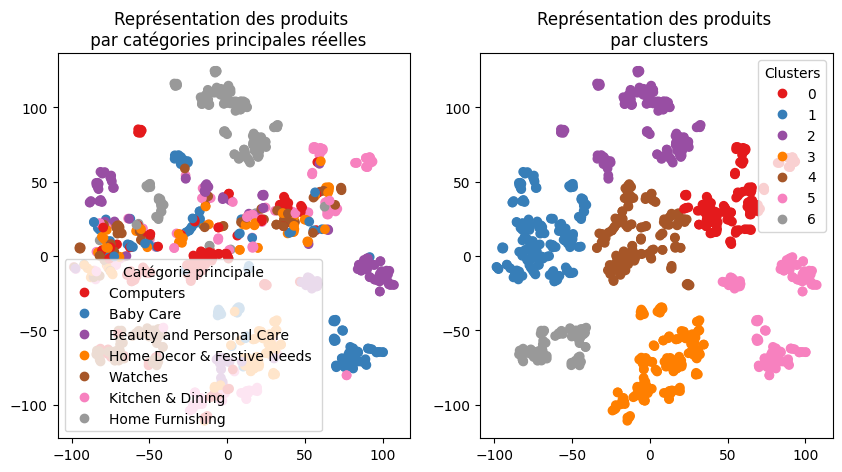

ARI :  0.2207
Dimensions feature  avant réduction TSNE : (1050, 68)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2214 time :  6.0 perplexity :  10


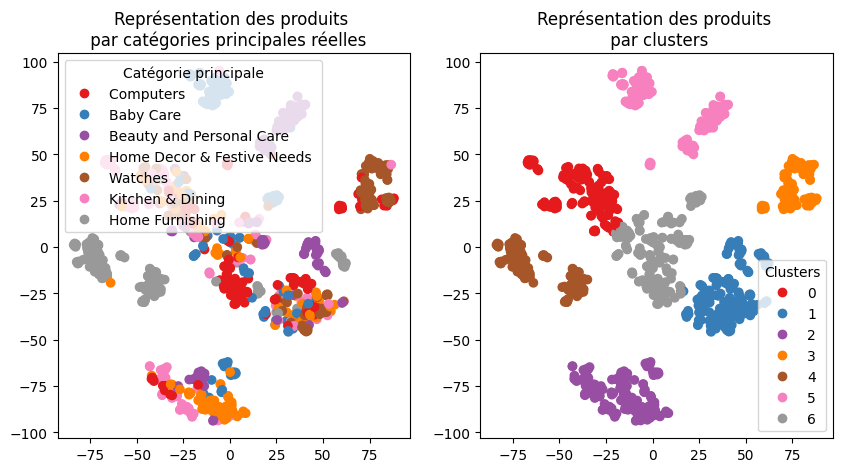

ARI :  0.2214
Dimensions feature  avant réduction TSNE : (1050, 68)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2403 time :  7.0 perplexity :  20


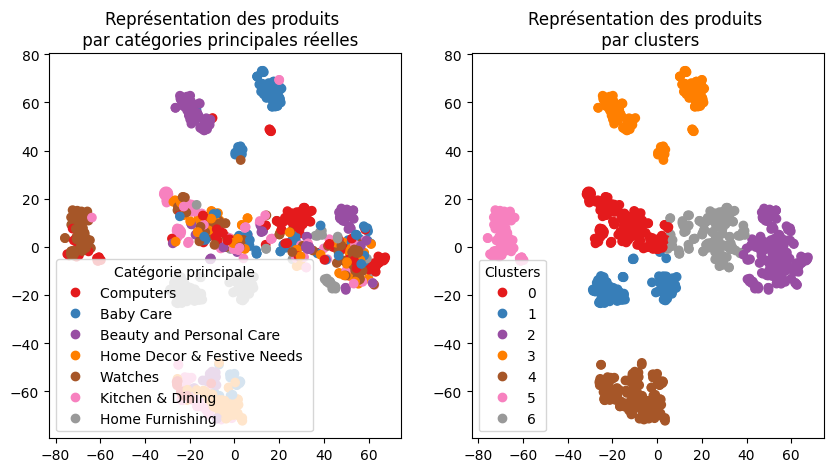

ARI :  0.2403
Dimensions feature  avant réduction TSNE : (1050, 68)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2288 time :  7.0 perplexity :  30


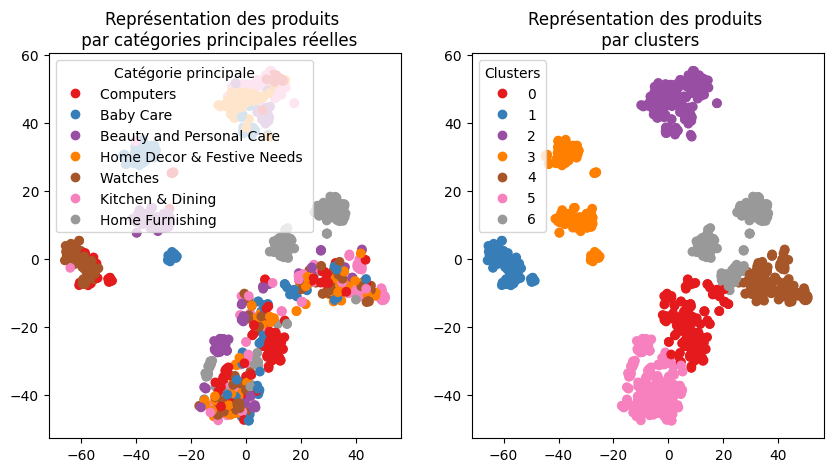

ARI :  0.2288
Dimensions feature  avant réduction TSNE : (1050, 68)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2247 time :  9.0 perplexity :  50


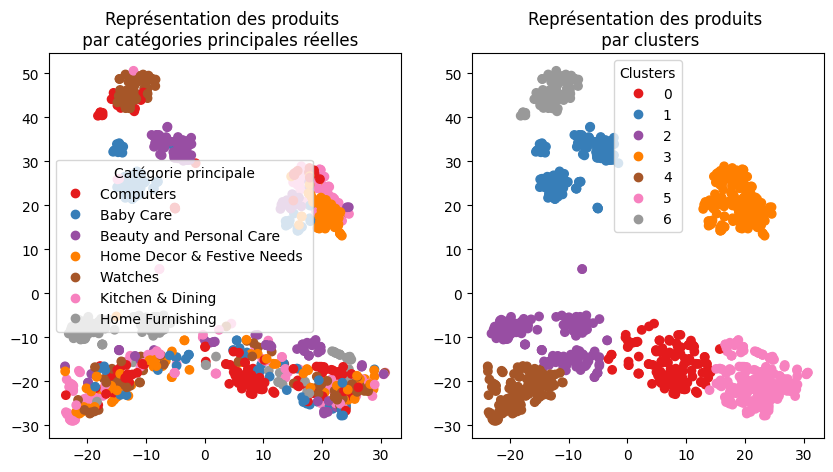

ARI :  0.2247


In [178]:
tsne_param(features_bert2_pca,per)

Dimensions feature  avant réduction TSNE : (1050, 68)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2403 time :  6.0 perplexity :  20


,cluster,nb_feature
0,0,169
1,1,126
2,2,189
3,3,157
4,4,173
5,5,94
6,6,142


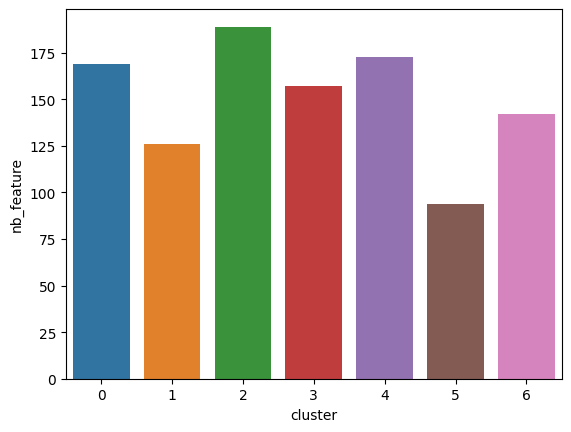

In [245]:
ARI11, X_tsne11, labels11 = ARI_fct(features_bert2_pca,20)
df11=feature_cluster(X_tsne11,labels11)


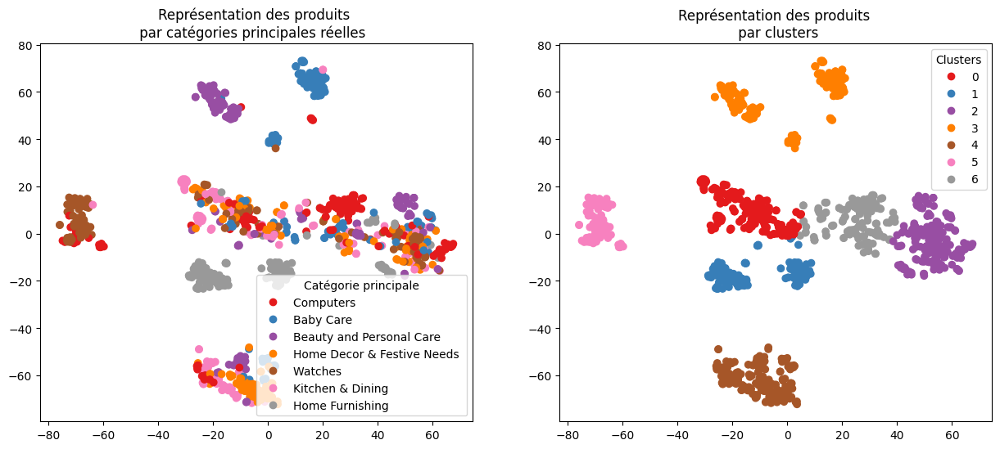

ARI :  0.2403


In [246]:
TSNE_visu_fct(X_tsne11, y_cat_num, labels11, ARI11,(15,6))

Bert:cardiffnlp/twitter-roberta-base-sentiment
Accuracy:  0.8428571428571429
F_measure:  0.8453544078029842


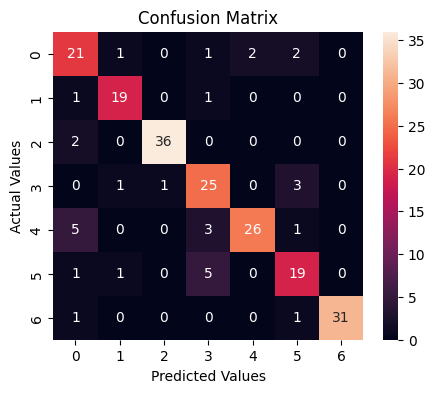

              precision    recall  f1-score   support

           0       0.68      0.78      0.72        27
           1       0.86      0.90      0.88        21
           2       0.97      0.95      0.96        38
           3       0.71      0.83      0.77        30
           4       0.93      0.74      0.83        35
           5       0.73      0.73      0.73        26
           6       1.00      0.94      0.97        33

    accuracy                           0.84       210
   macro avg       0.84      0.84      0.84       210
weighted avg       0.85      0.84      0.85       210



In [205]:
print('Bert:cardiffnlp/twitter-roberta-base-sentiment')    
model_b2, X_test_b2, y_test_b2 = create_RF_model(features_bert2, y_cat_num,200)
perf_class(model_b2, X_test_b2, y_test_b2 )

Bert:cardiffnlp/twitter-roberta-base-sentiment
Accuracy:  0.8571428571428571
F_measure:  0.8581691510407176


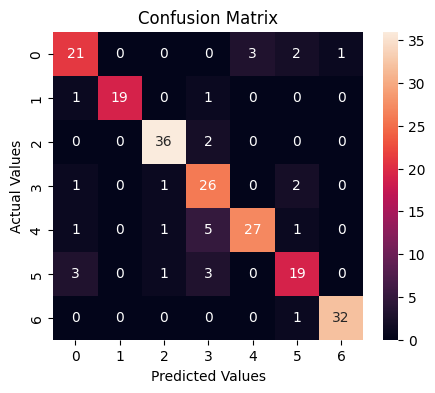

              precision    recall  f1-score   support

           0       0.78      0.78      0.78        27
           1       1.00      0.90      0.95        21
           2       0.92      0.95      0.94        38
           3       0.70      0.87      0.78        30
           4       0.90      0.77      0.83        35
           5       0.76      0.73      0.75        26
           6       0.97      0.97      0.97        33

    accuracy                           0.86       210
   macro avg       0.86      0.85      0.85       210
weighted avg       0.86      0.86      0.86       210



In [247]:
print('Bert:cardiffnlp/twitter-roberta-base-sentiment')    
model_b2p, X_test_b2p, y_test_b2p = create_RF_model(features_bert2_pca, y_cat_num,200)
perf_class(model_b2p, X_test_b2p, y_test_b2p )

## BERT hub Tensorflow

In [181]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [182]:
sentences = data_T['description_dl'].to_list()

In [183]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model3 = bert_layer

features_bert3, last_hidden_states_tot3 = feature_BERT_fct(model3, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  79.0


TSNE (BERT hub Tensorflow'): 
--------
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3312 time :  7.0 perplexity :  5


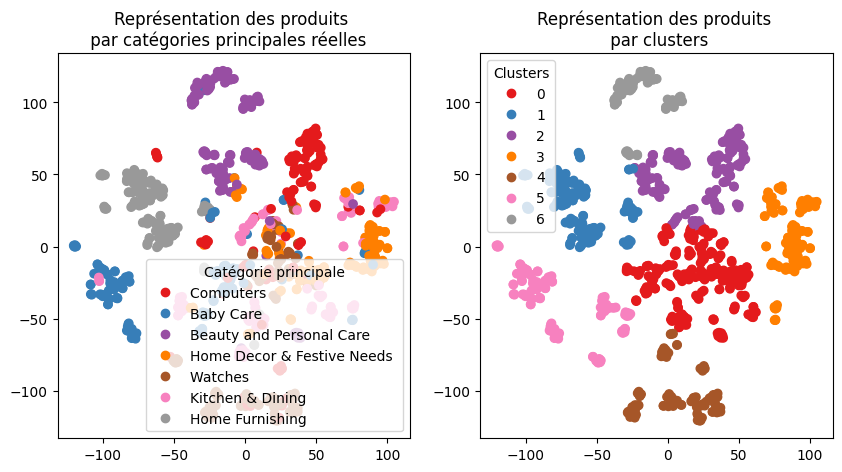

ARI :  0.3312
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3489 time :  6.0 perplexity :  10


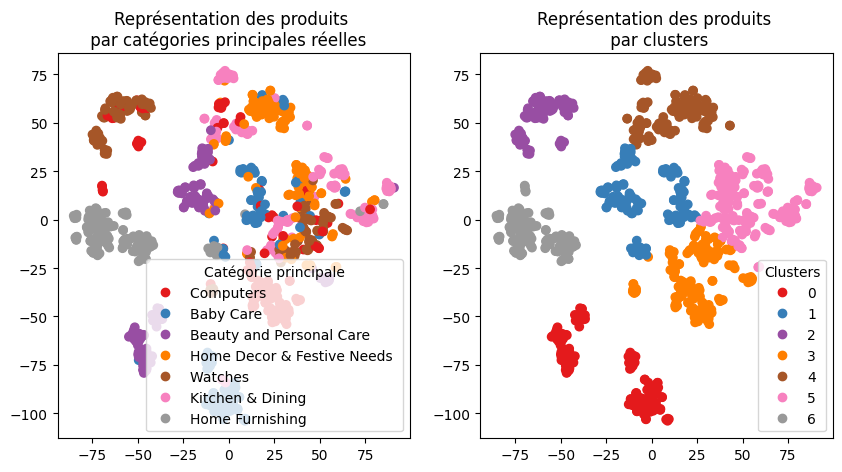

ARI :  0.3489
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3318 time :  7.0 perplexity :  20


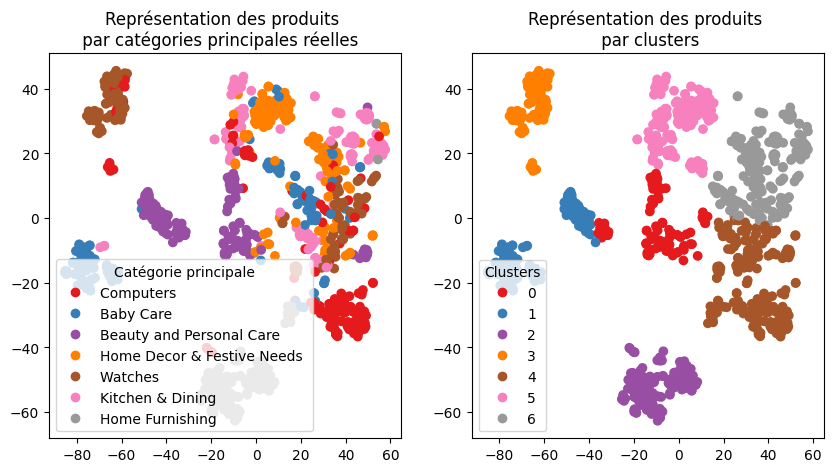

ARI :  0.3318
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3158 time :  7.0 perplexity :  30


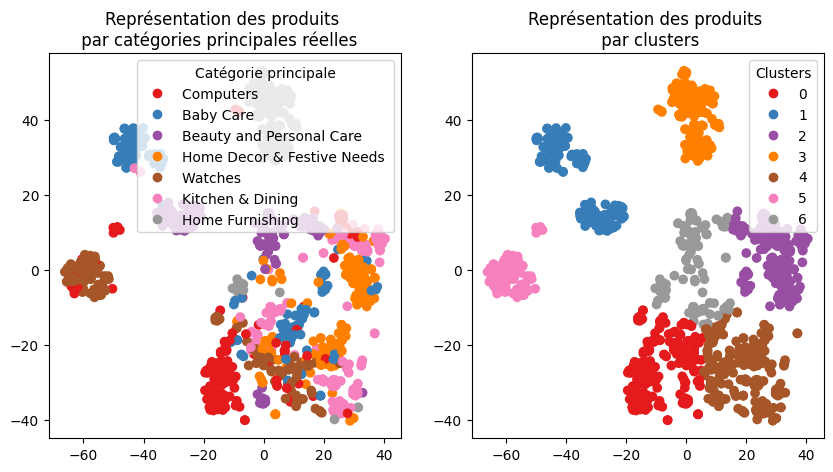

ARI :  0.3158
Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3157 time :  10.0 perplexity :  50


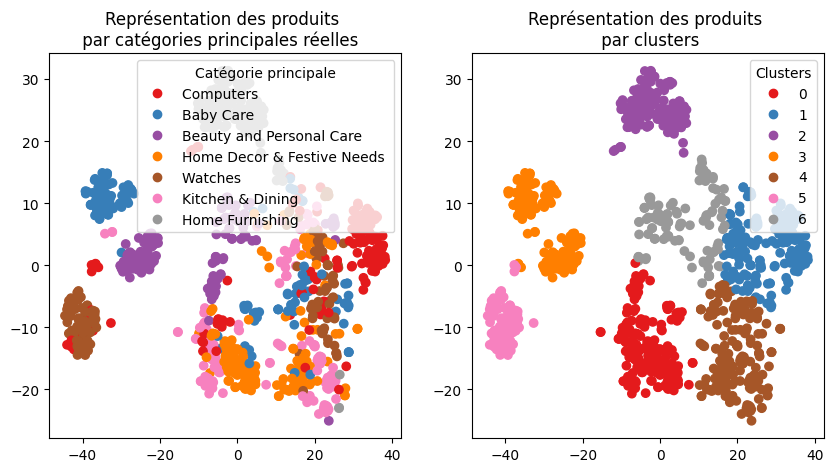

ARI :  0.3157


In [184]:
per=[5,10,20,30,50]
print("TSNE (BERT hub Tensorflow'): ")
print("--------")
tsne_param(features_bert3,per)

Dimensions feature  avant réduction TSNE : (1050, 768)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3489 time :  8.0 perplexity :  10


,cluster,nb_feature
0,0,151
1,1,145
2,2,94
3,3,174
4,4,147
5,5,200
6,6,139


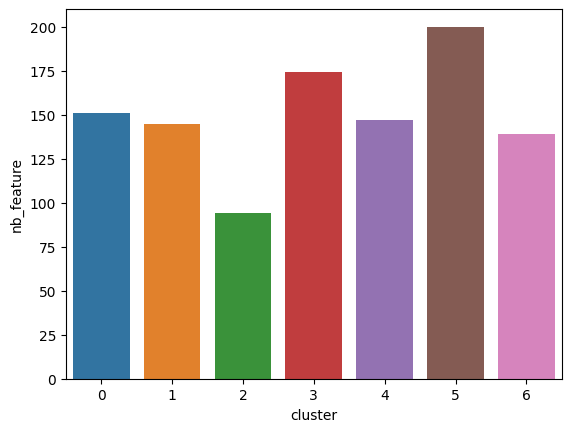

In [249]:
ARI12, X_tsne12, labels12 = ARI_fct(features_bert3,10)
df12=feature_cluster(X_tsne12,labels12)


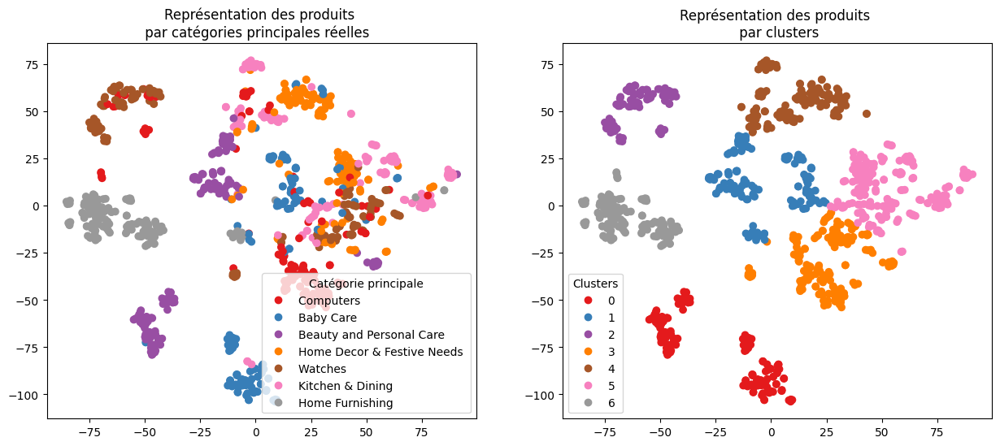

ARI :  0.3489


In [248]:
TSNE_visu_fct(X_tsne12, y_cat_num, labels12, ARI12,(15,6))

In [188]:
features_bert3_pca=pca_transform(features_bert3,' BERT hub Tensorflow')

Dimensions feature  BERT hub Tensorflow avant réduction PCA (1050, 768)
Dimensions feature  BERT hub Tensorflow après réduction PCA (1050, 153) 


TSNE ( BERT hub Tensorflow PCA): 
--------
Dimensions feature  avant réduction TSNE : (1050, 153)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2949 time :  7.0 perplexity :  5


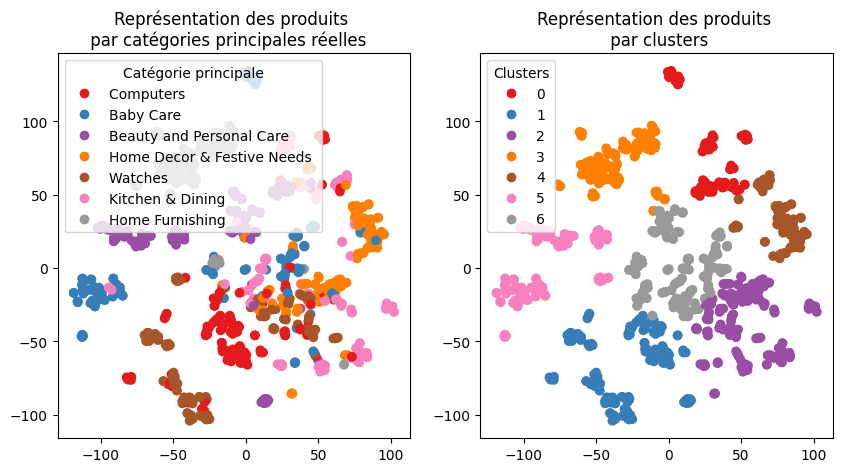

ARI :  0.2949
Dimensions feature  avant réduction TSNE : (1050, 153)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3204 time :  6.0 perplexity :  10


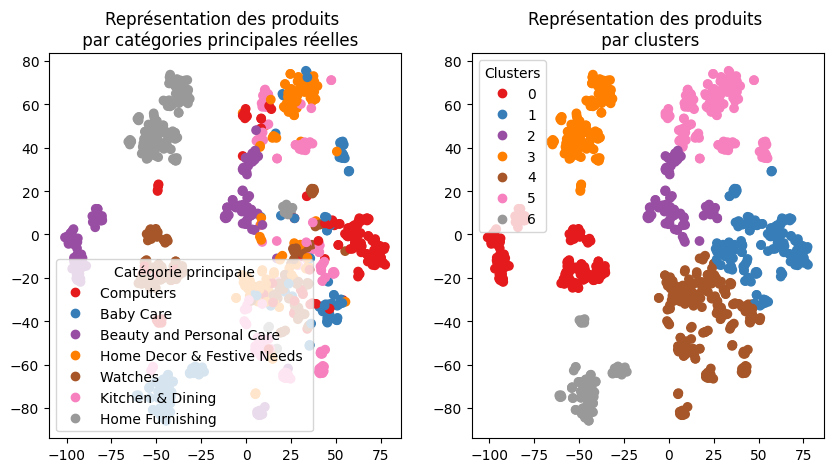

ARI :  0.3204
Dimensions feature  avant réduction TSNE : (1050, 153)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3139 time :  7.0 perplexity :  20


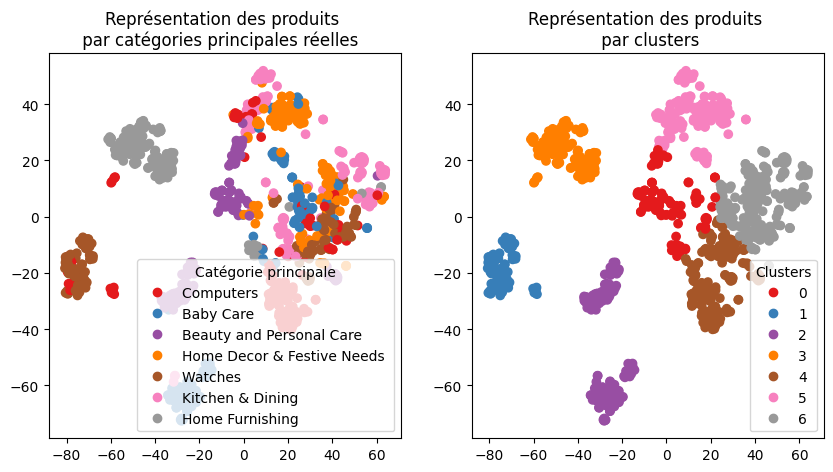

ARI :  0.3139
Dimensions feature  avant réduction TSNE : (1050, 153)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.334 time :  8.0 perplexity :  30


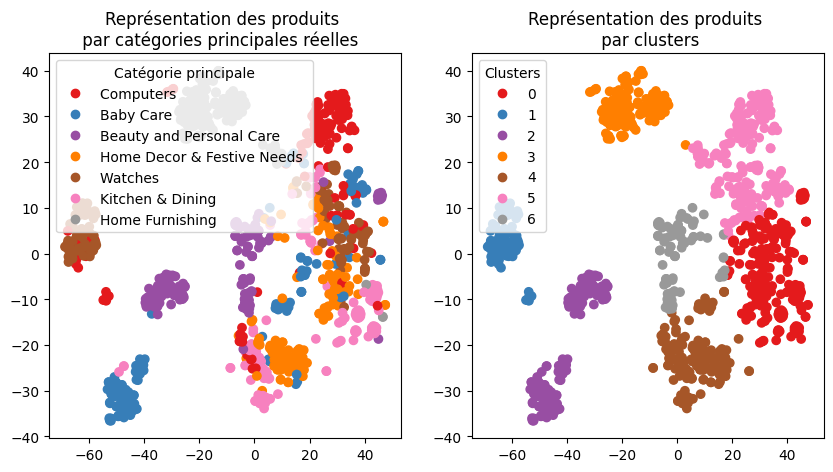

ARI :  0.334
Dimensions feature  avant réduction TSNE : (1050, 153)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3161 time :  10.0 perplexity :  50


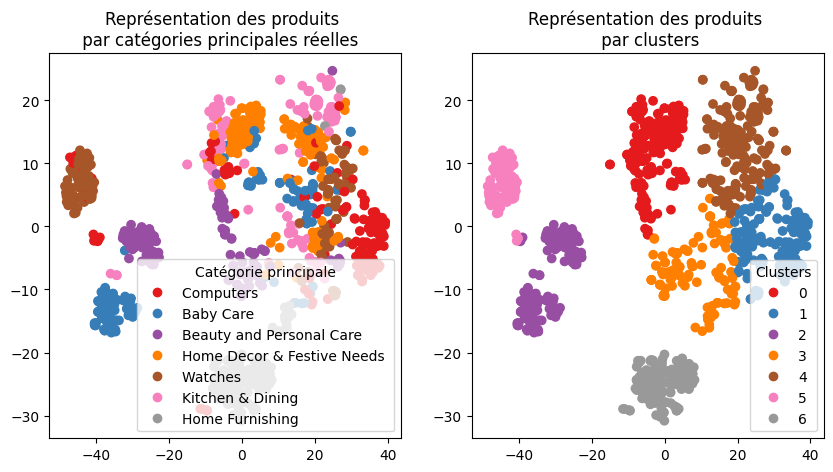

ARI :  0.3161


In [189]:
print("TSNE ( BERT hub Tensorflow PCA): ")
print("--------")
tsne_param(features_bert3_pca,per)

Dimensions feature  avant réduction TSNE : (1050, 153)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3204 time :  8.0 perplexity :  10


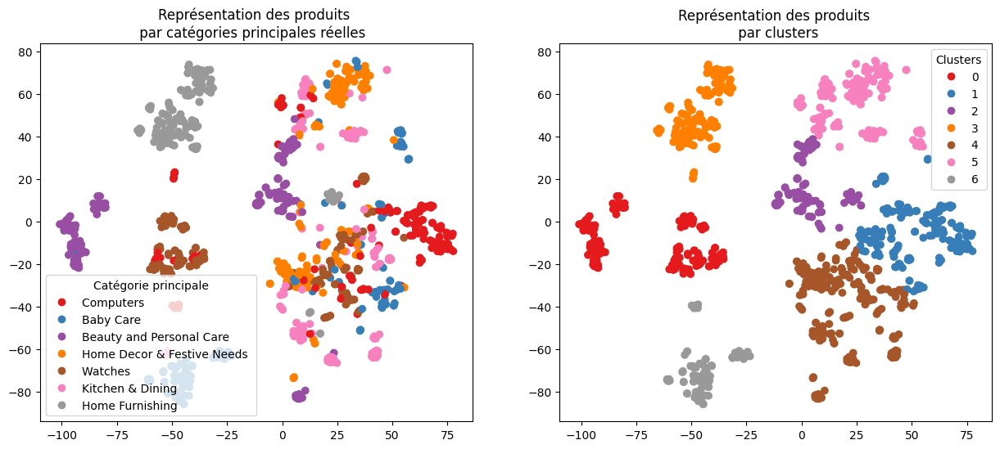

ARI :  0.3204


In [190]:
ARI13, X_tsne13, labels13 = ARI_fct(features_bert3_pca,10)
TSNE_visu_fct(X_tsne13, y_cat_num, labels13, ARI13,(15,6))

 BERT hub Tensorflow
Accuracy:  0.8809523809523809
F_measure:  0.8792011324980193


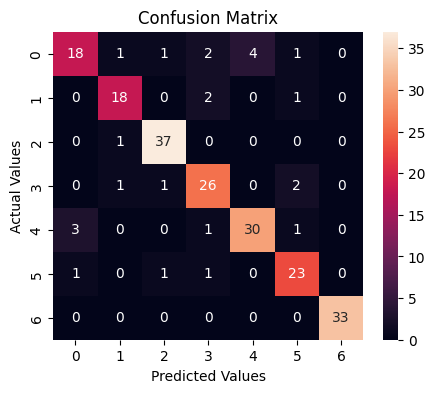

              precision    recall  f1-score   support

           0       0.82      0.67      0.73        27
           1       0.86      0.86      0.86        21
           2       0.93      0.97      0.95        38
           3       0.81      0.87      0.84        30
           4       0.88      0.86      0.87        35
           5       0.82      0.88      0.85        26
           6       1.00      1.00      1.00        33

    accuracy                           0.88       210
   macro avg       0.87      0.87      0.87       210
weighted avg       0.88      0.88      0.88       210



In [198]:
#Exécution

print(' BERT hub Tensorflow')    
model_b3, X_test_b3, y_test_b3 = create_RF_model(features_bert3, y_cat_num,60)
perf_class(model_b3, X_test_b3, y_test_b3 )

 BERT hub Tensorflow pca
Accuracy:  0.8476190476190476
F_measure:  0.8480320297790378


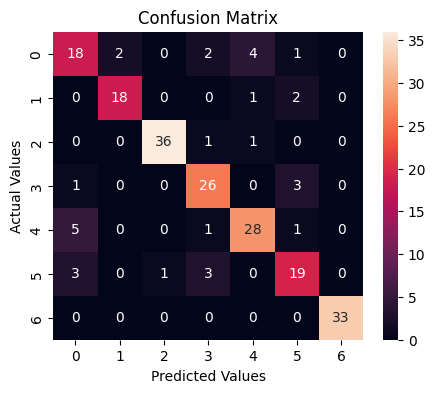

              precision    recall  f1-score   support

           0       0.67      0.67      0.67        27
           1       0.90      0.86      0.88        21
           2       0.97      0.95      0.96        38
           3       0.79      0.87      0.83        30
           4       0.82      0.80      0.81        35
           5       0.73      0.73      0.73        26
           6       1.00      1.00      1.00        33

    accuracy                           0.85       210
   macro avg       0.84      0.84      0.84       210
weighted avg       0.85      0.85      0.85       210



In [250]:
#Exécution

print(' BERT hub Tensorflow pca')    
model_b3p, X_test_b3p, y_test_b3p = create_RF_model(features_bert3_pca, y_cat_num,60)
perf_class(model_b3p, X_test_b3p, y_test_b3p )

## 3.3. USE - Universal Sentence Encoder <a class="anchor" id="use"></a>

In [208]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

In [209]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.10.0
2.10.0
Num GPUs Available:  0
True


In [210]:
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [211]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [212]:
batch_size = 10
sentences = data_T['description_dl'].to_list()

In [214]:
features_USE = feature_USE_fct(sentences, batch_size)

TSNE (USE'): 
--------
Dimensions feature  avant réduction TSNE : (1050, 512)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.308 time :  7.0 perplexity :  5


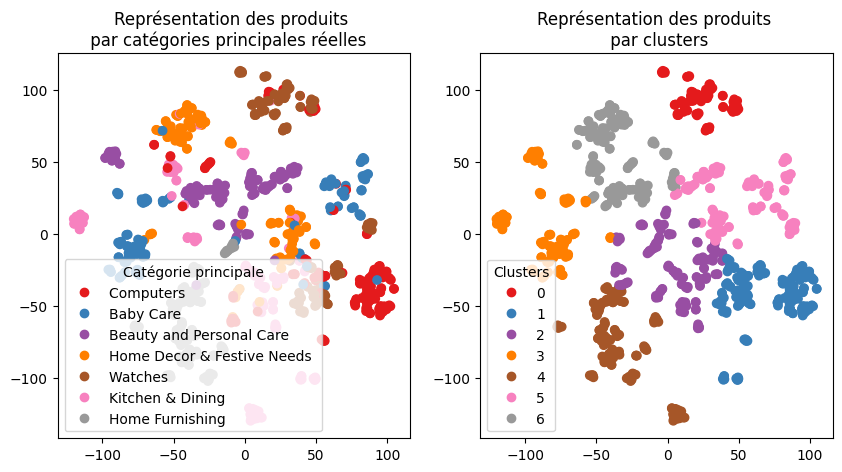

ARI :  0.308
Dimensions feature  avant réduction TSNE : (1050, 512)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3484 time :  6.0 perplexity :  10


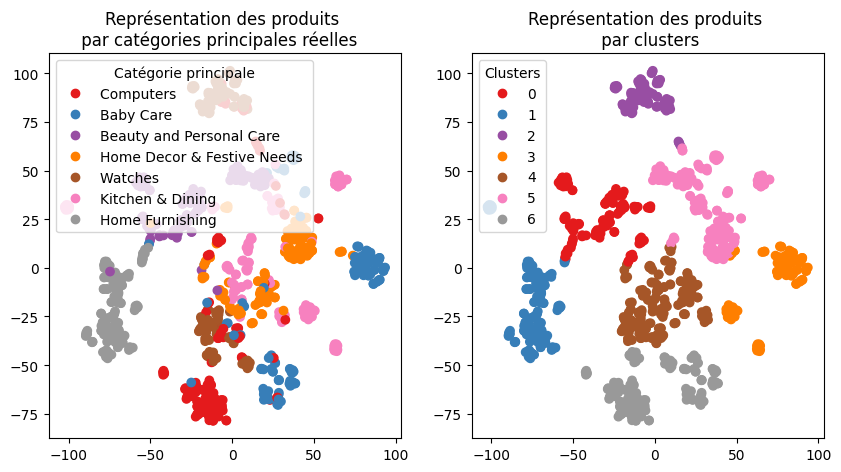

ARI :  0.3484
Dimensions feature  avant réduction TSNE : (1050, 512)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.45 time :  7.0 perplexity :  20


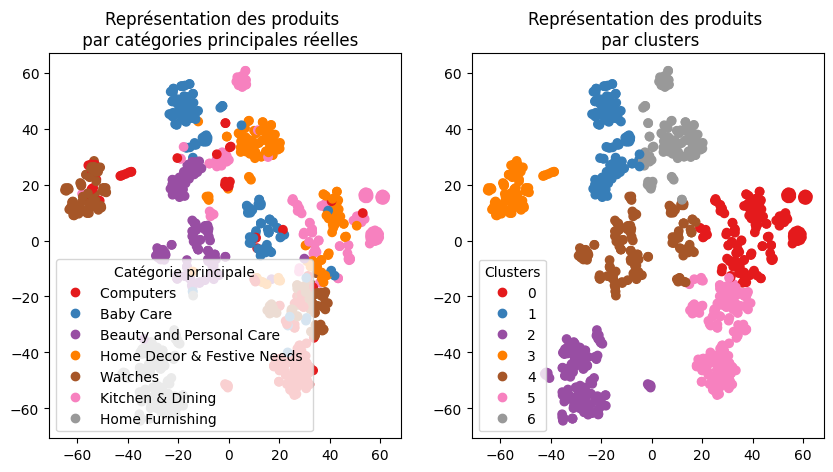

ARI :  0.45
Dimensions feature  avant réduction TSNE : (1050, 512)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4393 time :  8.0 perplexity :  30


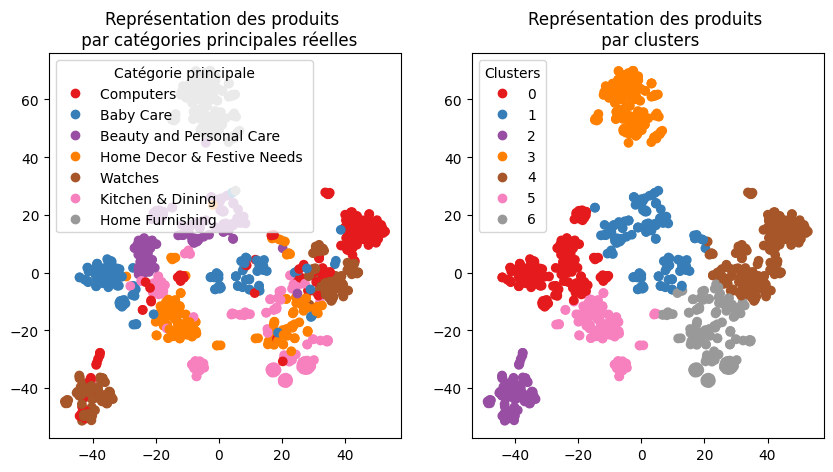

ARI :  0.4393
Dimensions feature  avant réduction TSNE : (1050, 512)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4182 time :  9.0 perplexity :  50


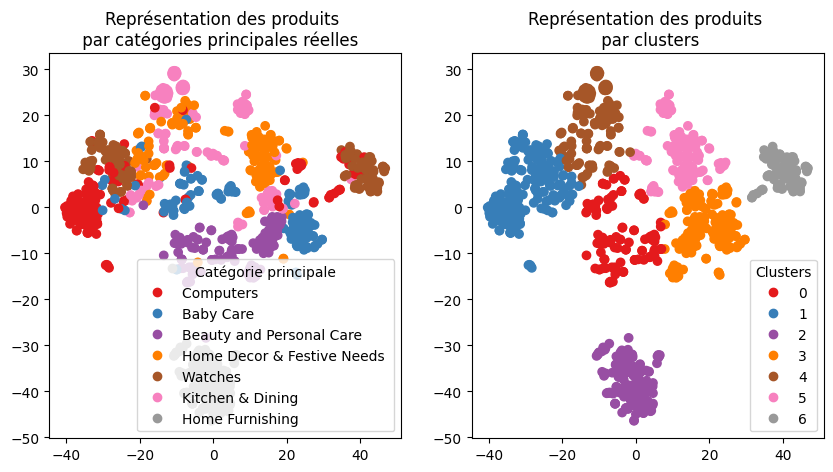

ARI :  0.4182


In [215]:
per=[5,10,20,30,50]
print("TSNE (USE'): ")
print("--------")
tsne_param(features_USE,per)

Dimensions feature  avant réduction TSNE : (1050, 512)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.45 time :  8.0 perplexity :  20


,cluster,nb_feature
0,0,176
1,1,141
2,2,155
3,3,95
4,4,166
5,5,189
6,6,128


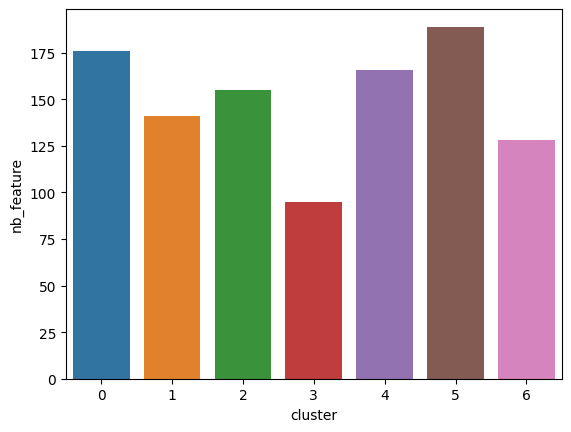

In [252]:
ARI15, X_tsne15, labels15 = ARI_fct(features_USE,20)
df15=feature_cluster(X_tsne15,labels15)

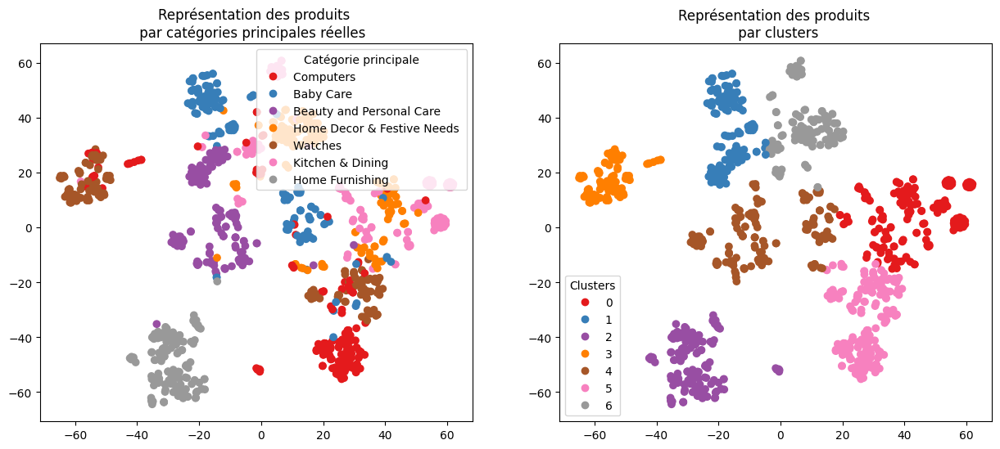

ARI :  0.45


In [217]:
TSNE_visu_fct(X_tsne15, y_cat_num, labels15, ARI15,(15,6))

Dimensions feature USE avant réduction PCA (1050, 512)
Dimensions feature USE après réduction PCA (1050, 174) 
Dimensions feature  avant réduction TSNE : (1050, 174)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3965 time :  7.0 perplexity :  5


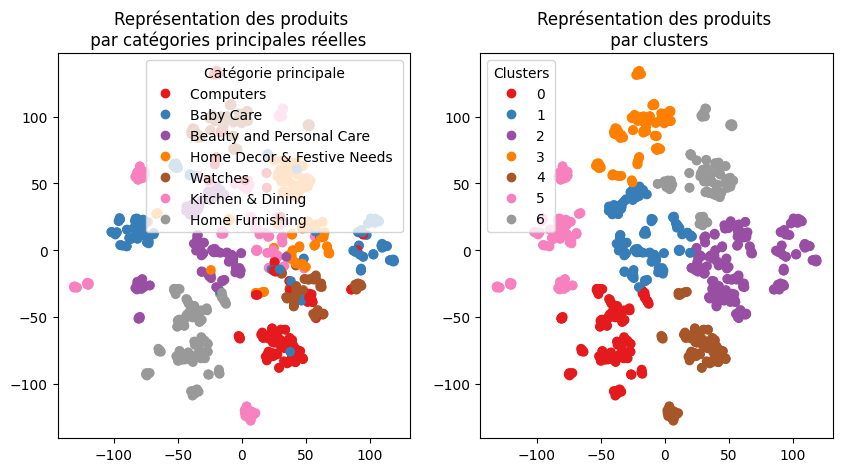

ARI :  0.3965
Dimensions feature  avant réduction TSNE : (1050, 174)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4001 time :  6.0 perplexity :  10


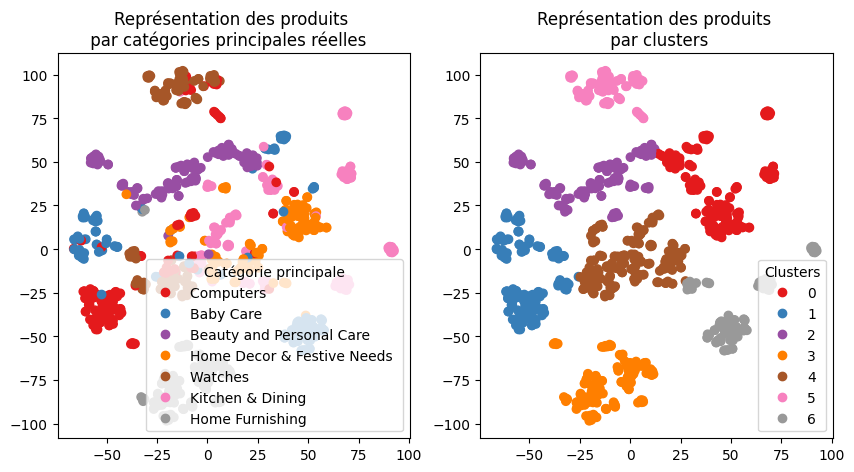

ARI :  0.4001
Dimensions feature  avant réduction TSNE : (1050, 174)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4042 time :  7.0 perplexity :  20


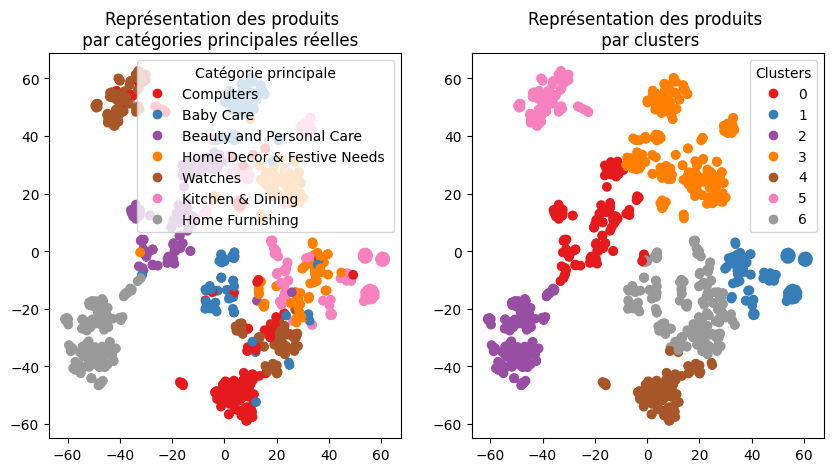

ARI :  0.4042
Dimensions feature  avant réduction TSNE : (1050, 174)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4342 time :  8.0 perplexity :  30


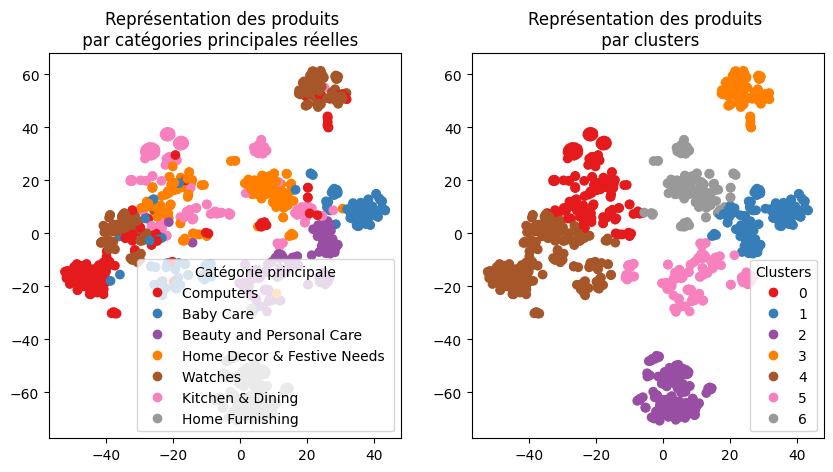

ARI :  0.4342
Dimensions feature  avant réduction TSNE : (1050, 174)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4193 time :  9.0 perplexity :  50


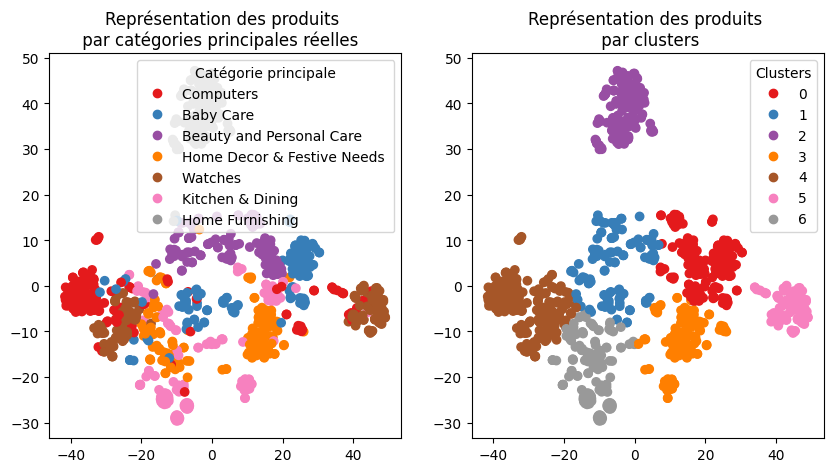

ARI :  0.4193


In [218]:
features_use_pca=pca_transform(features_USE,'USE')
tsne_param(features_use_pca,per)

Dimensions feature  avant réduction TSNE : (1050, 174)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.4342 time :  9.0 perplexity :  30


,cluster,nb_feature
0,0,172
1,1,155
2,2,148
3,3,95
4,4,233
5,5,125
6,6,122


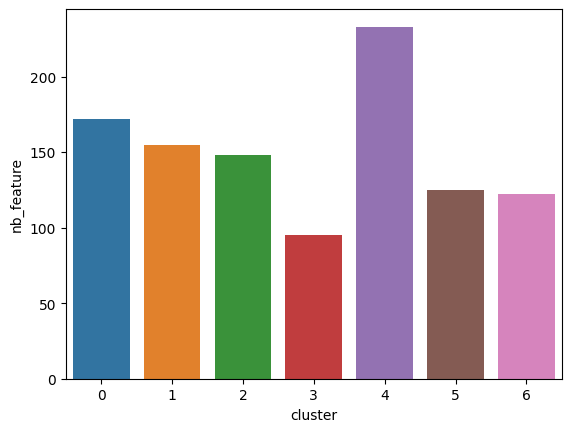

In [253]:
ARI16, X_tsne16, labels16 = ARI_fct(features_use_pca,30)
df16=feature_cluster(X_tsne16,labels16)

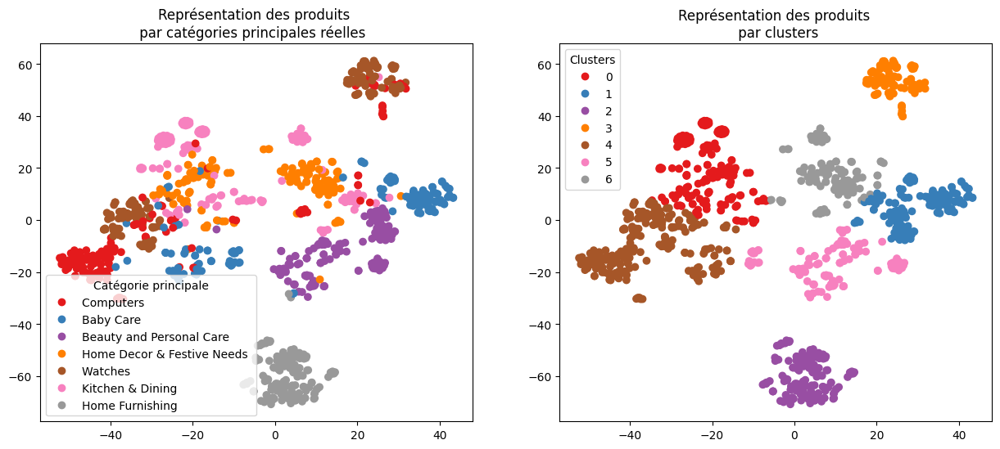

ARI :  0.4342


In [222]:
TSNE_visu_fct(X_tsne16, y_cat_num, labels16, ARI16,(15,6))

USE
Accuracy:  0.9142857142857143
F_measure:  0.9125801125562799


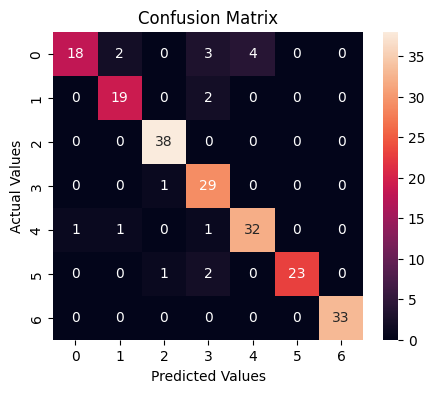

              precision    recall  f1-score   support

           0       0.95      0.67      0.78        27
           1       0.86      0.90      0.88        21
           2       0.95      1.00      0.97        38
           3       0.78      0.97      0.87        30
           4       0.89      0.91      0.90        35
           5       1.00      0.88      0.94        26
           6       1.00      1.00      1.00        33

    accuracy                           0.91       210
   macro avg       0.92      0.91      0.91       210
weighted avg       0.92      0.91      0.91       210



In [224]:
print('USE')    
model_u, X_test_u, y_test_u = create_RF_model(features_USE, y_cat_num,200)
perf_class(model_u, X_test_u, y_test_u )

USE PCA
Accuracy:  0.9333333333333333
F_measure:  0.9306611811012626


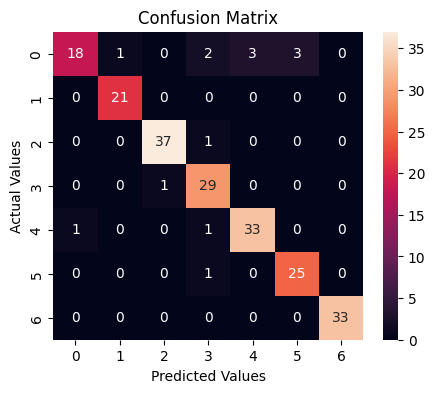

              precision    recall  f1-score   support

           0       0.95      0.67      0.78        27
           1       0.95      1.00      0.98        21
           2       0.97      0.97      0.97        38
           3       0.85      0.97      0.91        30
           4       0.92      0.94      0.93        35
           5       0.89      0.96      0.93        26
           6       1.00      1.00      1.00        33

    accuracy                           0.93       210
   macro avg       0.93      0.93      0.93       210
weighted avg       0.94      0.93      0.93       210



In [256]:
print('USE PCA')    
model_up, X_test_up, y_test_up= create_RF_model(features_use_pca, y_cat_num,200)
perf_class(model_up, X_test_up, y_test_up )